## **Problem Statement** - Maximize revenue from direct marketing campaigns using the provided dummy data.
Business Context: This case study simulates a real-world marketing scenario aimed at optimizing
resource allocation to maximize revenue.

## **Solution Approach** - Build a propensity model - classification model to estimate the likelihood of purchase for
1. Consumer Loan
2. Credit card
3. Mutual Fund

In [ ]:
##Importing Packages

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats as stats
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder,StandardScaler

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.metrics import balanced_accuracy_score, accuracy_score, precision_score, recall_score, f1_score
import xgboost as xgb
import shap
from typing import List
from sklearn.utils.class_weight import compute_class_weight,compute_sample_weight


## **Data Preparation**

In [ ]:
def read_exceldata(path,sheetname):
  data = pd.read_excel(path,sheet_name=sheetname)
  return data

In [ ]:
filepath = "/content/DataScientist_CaseStudy_Dataset.xlsx"
sheetnames = ["Soc_Dem","Products_ActBalance","Inflow_Outflow","Sales_Revenues"]
for i in sheetnames:
    globals()["data_"+i.lower()] = read_exceldata(filepath,i)

In [ ]:
data_soc_dem.shape,data_products_actbalance.shape,data_inflow_outflow.shape,data_sales_revenues.shape

((1615, 4), (1615, 13), (1587, 15), (969, 7))

In [ ]:
for sheetname in sheetnames:
    df_name = "data_" + sheetname.lower()
    df = globals()[df_name]
    unique_client_ids = df['Client'].nunique()
    print(f"Number of unique Clients in {sheetname}: {unique_client_ids}")



Number of unique Clients in Soc_Dem: 1615
Number of unique Clients in Products_ActBalance: 1615
Number of unique Clients in Inflow_Outflow: 1587
Number of unique Clients in Sales_Revenues: 969


## Join the tables

In [ ]:
finaldf = pd.merge(data_soc_dem,data_products_actbalance,on="Client",how="inner")
print(finaldf.shape)
finaldf
finaldf = pd.merge(finaldf,data_inflow_outflow,on="Client",how="left")
finaldf

(1615, 16)


,Client,Sex,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,Count_CL,...,VolumeDeb,VolumeDeb_CA,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_CA,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder
0,909,M,21,27,1,NaN,NaN,1.0,NaN,1.0,...,450.678571,448.892857,178.571429,0.000000,166.571429,8.0,7.0,1.0,0.0,4.0
1,1217,M,38,165,1,NaN,NaN,NaN,NaN,NaN,...,714.285714,714.285714,0.000000,0.000000,714.285714,1.0,1.0,0.0,0.0,1.0
2,850,F,49,44,1,NaN,NaN,NaN,NaN,NaN,...,1226.345357,1226.345357,0.000000,0.000000,121.928571,6.0,6.0,0.0,0.0,1.0
3,1473,M,54,34,1,1.0,NaN,NaN,1.0,1.0,...,3875.137857,3794.580714,357.142857,444.597500,2076.785714,48.0,38.0,1.0,26.0,11.0
4,1038,M,29,106,1,NaN,NaN,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1610,409,M,31,91,1,NaN,NaN,1.0,NaN,NaN,...,465.092857,465.092857,178.571429,11.414286,271.714286,12.0,12.0,1.0,1.0,9.0
1611,384,M,23,160,1,NaN,NaN,NaN,NaN,NaN,...,88.443929,88.443929,50.000000,37.372500,1.071429,8.0,8.0,2.0,5.0,1.0
1612,977,M,46,59,1,NaN,NaN,NaN,NaN,NaN,...,76.103571,76.103571,75.000000,1.067857,0.035714,4.0,4.0,2.0,1.0,1.0
1613,629,F,61,173,1,NaN,2.0,NaN,NaN,NaN,...,817.462143,817.462143,660.714286,41.355000,115.178571,17.0,17.0,3.0,5.0,8.0


In [ ]:
train_df = pd.merge(data_sales_revenues,finaldf,on="Client",how="left")
train_df

,Client,Sale_MF,Sale_CC,Sale_CL,Revenue_MF,Revenue_CC,Revenue_CL,Sex,Age,Tenure,...,VolumeDeb,VolumeDeb_CA,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_CA,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder
0,1094,0,1,0,0.000000,5.138571,0.000000,M,25,8,...,1366.313929,1366.313929,53.571429,351.950357,891.327857,31.0,31.0,1.0,21.0,4.0
1,1484,1,0,1,25.609107,0.000000,8.722500,M,39,0,...,768.625000,768.625000,107.142857,302.446429,357.785714,23.0,23.0,1.0,16.0,5.0
2,20,0,1,0,0.000000,3.822500,0.000000,M,27,181,...,221.428571,221.428571,107.142857,10.714286,103.571429,7.0,7.0,3.0,1.0,3.0
3,1193,0,0,0,0.000000,0.000000,0.000000,M,48,16,...,1661.201071,1207.906429,507.142857,331.150000,75.178571,55.0,36.0,6.0,21.0,2.0
4,142,0,0,0,0.000000,0.000000,0.000000,F,27,183,...,728.107143,728.107143,0.000000,0.000000,725.928571,2.0,2.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,1316,0,0,1,0.000000,0.000000,3.317500,F,63,158,...,2985.423571,2874.767857,400.000000,507.816429,2029.250000,41.0,39.0,4.0,26.0,10.0
965,905,1,1,1,1.761071,0.892857,13.166786,M,37,11,...,634.845357,634.845357,0.000000,0.000000,631.452500,2.0,2.0,0.0,0.0,1.0
966,938,0,1,1,0.000000,4.928571,7.812143,M,57,33,...,470.528571,470.528571,85.714286,221.528571,163.285714,17.0,17.0,2.0,9.0,6.0
967,434,0,0,0,0.000000,0.000000,0.000000,M,64,130,...,174.010714,174.010714,71.428571,9.510714,92.857143,8.0,8.0,4.0,2.0,1.0


In [ ]:
non_common_members = data_soc_dem[~data_soc_dem['Client'].isin(data_sales_revenues['Client'])]

non_common_members


,Client,Sex,Age,Tenure
0,909,M,21,27
6,699,M,37,175
9,528,F,19,70
10,1145,M,61,45
13,517,F,41,28
...,...,...,...,...
1598,419,F,33,82
1600,1024,M,65,13
1608,464,M,68,153
1610,409,M,31,91


In [ ]:
test_df = pd.merge(non_common_members,data_products_actbalance,on="Client",how="left")
test_df = pd.merge(test_df,data_inflow_outflow,on="Client",how="left")
test_df

,Client,Sex,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,Count_CL,...,VolumeDeb,VolumeDeb_CA,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_CA,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder
0,909,M,21,27,1,NaN,NaN,1.0,NaN,1.0,...,450.678571,448.892857,178.571429,0.000000,166.571429,8.0,7.0,1.0,0.0,4.0
1,699,M,37,175,1,NaN,4.0,1.0,NaN,NaN,...,661.483214,566.126071,89.285714,0.000000,216.892857,13.0,10.0,2.0,0.0,5.0
2,528,F,19,70,1,NaN,NaN,1.0,NaN,NaN,...,390.056429,390.056429,125.000000,70.842143,190.821429,10.0,10.0,4.0,3.0,2.0
3,1145,M,61,45,1,NaN,NaN,NaN,NaN,NaN,...,3.392857,3.392857,0.000000,0.000000,0.000000,1.0,1.0,0.0,0.0,0.0
4,517,F,41,28,1,NaN,NaN,NaN,NaN,NaN,...,557.896429,557.896429,71.428571,224.146429,251.178571,17.0,17.0,2.0,10.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,419,F,33,82,1,NaN,NaN,1.0,NaN,NaN,...,1404.483571,934.384643,0.000000,0.000000,0.000000,9.0,5.0,0.0,0.0,0.0
642,1024,M,65,13,1,NaN,NaN,NaN,NaN,NaN,...,109.107143,109.107143,107.142857,0.000000,0.000000,3.0,3.0,2.0,0.0,0.0
643,464,M,68,153,2,NaN,NaN,1.0,NaN,NaN,...,577.385714,577.385714,160.714286,65.421429,347.857143,12.0,12.0,2.0,3.0,6.0
644,409,M,31,91,1,NaN,NaN,1.0,NaN,NaN,...,465.092857,465.092857,178.571429,11.414286,271.714286,12.0,12.0,1.0,1.0,9.0


In [ ]:
train_df.shape,test_df.shape

((969, 36), (646, 30))

In [ ]:
train_df.columns

Index(['Client', 'Sale_MF', 'Sale_CC', 'Sale_CL', 'Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder'],
      dtype='object')

In [ ]:
## Eventhough its a dummy data, we have around 60 members in the train data whose age<18 which is against the fact
## that a bank account is owned by a person >=18 years of age. Removing those members otherwise the model built will get biased with such datapoints
## since age is also a factor that contributes to the buying behaviour

In [ ]:
train_df = train_df.loc[train_df["Age"]>=18]
test_df = test_df.loc[test_df["Age"]>=18]

In [ ]:
train_df.shape,test_df.shape

((909, 36), (606, 30))

In [ ]:
# 3 datasets
train_data_cl = train_df[['Client','Sale_CL', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']]
train_data_cc = train_df[['Client','Sale_CC', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']]
train_data_mf = train_df[['Client','Sale_MF', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']]



## **Defining Modular Functions for EDA and Data Preprocessing**

In [ ]:
# Setting the aesthetic style of the plots
sns.set_style("whitegrid")

#Modular functions for EDA
def readdata(filepath):
    data = pd.read_csv(filepath)
    return data

def dataproperties(data:pd.DataFrame):
  print("The shape of dataset")
  print(data.shape)
  print('The columns in the dataset')
  print(data.columns)
  print("The datatypes of columns")
  print(data.dtypes)
  return

def datadescribe(data:pd.DataFrame):
  print("The statistical description of the dataset")
  print(data.describe())
  return

def columncount(data:pd.DataFrame):
  countobject =0
  countnum =0
  countbool = 0
  for i in data.columns:
    if data[i].dtypes=="object":
      countobject+=1
    elif data[i].dtypes in ("int64","float64"):
      countnum+=1
    elif data[i].dtypes=="bool":
      countbool+=1
  print("No. of numerical columns excluding ID and target column "+str(countnum-2))
  print("No. of categorical columns "+str(countobject))
  print("No. of boolean columns "+str(countbool))
  return

def check_distribution_categorical(data:pd.DataFrame):
  for i in data.columns:
    if data[i].dtypes=="object" or data[i].dtypes=="bool":
      print("Column Name "+ i )
      print("The no of unique elements is " + str(data[i].nunique()))
      print("The unique values are "+str(data[i].value_counts()))
      print()
      print()
  return

def check_distribution_numerical(data:pd.DataFrame,columnlist:List):
  num_cols = len(columnlist)
  num_rows = (num_cols + 1) // 2

  fig, axes = plt.subplots(nrows=num_rows, ncols=2, figsize=(15, 9 * num_rows / 2))
  plt.subplots_adjust(right=1)

  count1 = 0
  count2 = 0
  for i in columnlist:
      test = pd.DataFrame(data[i])
      # Handle single subplot case
      if num_rows == 1 and num_cols == 1:
          test.plot(ax=axes, kind="hist")  # Use axes directly
      else:
          test.plot(ax=axes[count1, count2], kind="hist")
      if count2 == 1:
          count1 += 1
          count2 = 0
      else:
          count2 += 1
  return

def plot_column_value_counts(data:pd.DataFrame):
  count_list = []
  count = 0
  for i in data.columns:
    if data[i].dtypes =="object":
        data[i].value_counts().plot(title = i,kind="bar",figsize=(5,5))
        plt.xlabel("Unique values")
        plt.ylabel("Count")
        plt.show()
        count_list.append({i:data[i].value_counts().idxmax()})
  return count_list

def countuniquevalues_categorical(data:pd.DataFrame,column:str):
  return data[column].value_counts()

def plot_histograms_boxplots(data:pd.DataFrame, columns:List):
    fig, axes = plt.subplots(len(columns), 2, figsize=(12, 4 * len(columns)))
    for i, col in enumerate(columns):
        # Histogram
        sns.histplot(data[col], kde=True, ax=axes[i, 0])
        axes[i, 0].set_title(f'Histogram of {col}')
        # Boxplot
        sns.boxplot(x=data[col], ax=axes[i, 1])
        axes[i, 1].set_title(f'Boxplot of {col}')
    plt.tight_layout()


The shape of dataset
(909, 36)
The columns in the dataset
Index(['Client', 'Sale_MF', 'Sale_CC', 'Sale_CL', 'Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder'],
      dtype='object')
The datatypes of columns
Client                            int64
Sale_MF                           int64
Sale_CC                           int64
Sale_CL                           int64
Revenue_MF                      float64
Revenue_CC                      float64
Revenue_CL   

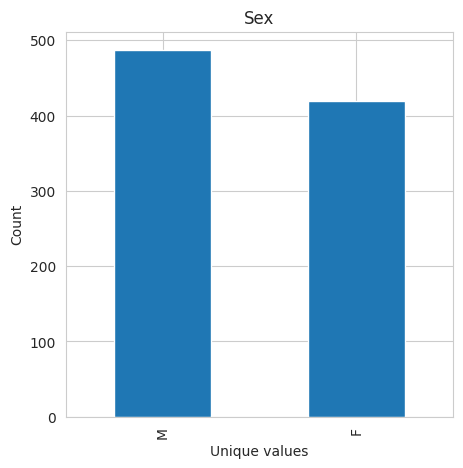

[{'Sex': 'M'}]
No of members with mutual fund Sale_MF
0    727
1    182
Name: count, dtype: int64
No of members with consumer loan Sale_CL
0    651
1    258
Name: count, dtype: int64
No of members with credit card Sale_CC
0    677
1    232
Name: count, dtype: int64


In [ ]:
dataproperties(train_df)
datadescribe(train_df)
columncount(train_df)
check_distribution_categorical(train_df)
count_list = plot_column_value_counts(train_df)
print(count_list)
countcat_list = countuniquevalues_categorical(train_df,"Sale_MF")
print("No of members with mutual fund "+str(countcat_list))
countcat_list = countuniquevalues_categorical(train_df,"Sale_CL")
print("No of members with consumer loan "+str(countcat_list))
countcat_list = countuniquevalues_categorical(train_df,"Sale_CC")
print("No of members with credit card "+str(countcat_list))

In [ ]:
train_df.columns

Index(['Client', 'Sale_MF', 'Sale_CC', 'Sale_CL', 'Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder'],
      dtype='object')

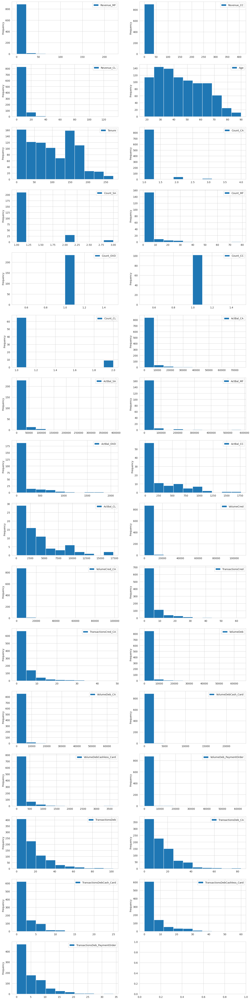

In [ ]:
check_distribution_numerical(train_df,['Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder'])

In [ ]:
pd.set_option('display.max_columns', None)
train_df.describe()

,Client,Sale_MF,Sale_CC,Sale_CL,Revenue_MF,Revenue_CC,Revenue_CL,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,Count_CL,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CC,ActBal_CL,VolumeCred,VolumeCred_CA,TransactionsCred,TransactionsCred_CA,VolumeDeb,VolumeDeb_CA,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_CA,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder
count,909.000000,909.000000,909.000000,909.000000,909.000000,909.000000,909.000000,909.000000,909.000000,909.000000,249.000000,174.000000,235.0,102.0,74.000000,909.000000,249.000000,174.000000,235.000000,102.000000,74.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,812.225523,0.200220,0.255226,0.283828,1.964220,2.842548,3.378272,45.237624,100.037404,1.078108,1.184739,4.672414,1.0,1.0,1.121622,2560.944473,13330.163292,17030.504487,148.115360,287.272101,3881.677896,1904.387443,1535.924272,5.750842,4.382716,1756.998520,1552.325576,273.991839,159.656577,750.739389,16.551066,13.957351,2.031425,5.413019,4.702581
std,464.765502,0.400385,0.436228,0.451103,10.185463,18.252174,7.577138,16.853629,65.189344,0.330955,0.464472,7.906362,0.0,0.0,0.329079,6428.273067,31550.389731,56177.832272,329.947948,385.765345,3841.917255,6407.460513,4962.057501,6.544634,5.045244,4776.964263,4506.638715,897.139738,339.291215,3196.263729,16.550584,13.061926,2.709766,8.449321,5.244600
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,-15.479286,63.803214,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,418.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000,42.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,70.548571,882.233571,0.000000,0.000000,0.714286,1118.136250,280.338929,252.933393,2.000000,2.000000,252.936964,233.500000,0.000000,0.000000,3.553571,5.000000,4.000000,0.000000,0.000000,1.000000
50%,821.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.000000,95.000000,1.000000,1.000000,2.000000,1.0,1.0,1.000000,542.171429,4113.770357,1953.776429,0.000000,37.125000,2866.243393,682.870357,643.187857,4.000000,3.000000,692.178571,668.489286,89.285714,27.832143,185.714643,12.000000,11.000000,1.000000,2.000000,3.000000
75%,1214.000000,0.000000,1.000000,1.000000,0.000000,0.214286,4.214286,59.000000,151.000000,1.000000,1.000000,5.000000,1.0,1.0,1.000000,2282.524286,12657.740000,10789.331071,113.992500,525.967321,4715.609018,1496.499464,1331.132857,6.000000,5.000000,1467.178036,1339.187857,357.142857,184.763036,520.405714,23.000000,19.000000,3.000000,7.000000,7.000000
max,1613.000000,1.000000,1.000000,1.000000,220.488214,407.962500,133.275357,90.000000,271.000000,4.000000,3.000000,79.000000,1.0,1.0,2.000000,74934.956071,389883.830714,579084.107857,2055.325357,1767.785357,17300.489643,107703.804286,98717.675000,63.000000,48.000000,64608.361429,64178.185357,23571.428571,3637.616786,61955.103929,102.000000,83.000000,25.000000,60.000000,34.000000


# **Analysis 1**
1. We have 4 datasets - \
  a. Socio Demographics - Shape of dataset (1615, 4)\
  b. Product Account Balance - Shape of dataset (1615, 13)\
  c. Inflow Outflow - Shape of dataset (1587, 15)\
  d. Sales Revenue - Shape of dataset (969, 7)

Train dataset contains 969 members, hence the train dataset is prepared by joining socio demographics, product accnt balance, inflow outflow and then left join to sales revenue.
**Shape of train dataset is (969, 36)**

The non common members betweeen socio demographics and sales revenue form the testdataset. It is then joined with product account balance and inflow outflow.
**Shape of test dataset is , (646, 30)** - 3 target columns and 3 revenue columns not present,hence 30

Eventhough its a dummy data, we have around 60 members in the train data whose age<18 which is against the fact that a bank account is owned by a person >=18 years of age. Removing those members otherwise the model built will get biased with such datapoints.

Hence final shape of train and test datasets is 909,36 and 606,30
## since age is also a factor that contributes to the buying behaviour
2. The columns in the dataset \
**'Client', 'Sale_MF', 'Sale_CC', 'Sale_CL', 'Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Sex', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder'**
3. Three datasets with respective target columns are created, one each for consumer loan, credit card and mutual fund. Since the target columns are created as binary 1/0 based on the revenue columns, the revenue columns **'Revenue_MF', 'Revenue_CC','Revenue_CL'** can be removed for now.

4. Checking the mean, min, max of numerical columns \
From this it can be seen that mean Age, Tenure is around 45years,and 100 months.
Also notice that ActBal_CC has negative values as shown under the min value. This could be because the credit card balance of members is negative. Need to investigate if error or indicates negative balance\

5. **Missing Values in columns**\
  a. Count_SA	Count_MF	Count_OVD	Count_CC	Count_CL	ActBal_CA	ActBal_SA	ActBal_MF	ActBal_OVD	ActBal_CC	ActBal_CL	VolumeCred	VolumeCred_CA	TransactionsCred	TransactionsCred_CA	VolumeDeb	VolumeDeb_CA	VolumeDebCash_Card	VolumeDebCashless_Card	VolumeDeb_PaymentOrder	TransactionsDeb	TransactionsDeb_CA	TransactionsDebCash_Card	TransactionsDebCashless_Card	TransactionsDeb_PaymentOrder have null values. Either the data is not available for such members which means the members dont have savings account/mutual fund or credit cards thereby their related columns dont have any values. Hence they can be filled with 0.
  Remaining columns do not contain null values

  b. The percentage of null values in these columns is quite high.***(Count_SA	Count_MF	Count_OVD	Count_CC	Count_CL,ActBal_SA	ActBal_MF	ActBal_OVD	ActBal_CC	ActBal_CL)***. Need to understand why the data is missing. Data could be missing since the members dont have these accounts.If valid then missing value imputation methods like
  1. Replace with zero indicating that the member does not have the account/MF/credit card.
  2. mean or median imputation  
  2. forward fill or backward fill
  3. Probability imputation should be applied.

  The percentage of null values in these credit card related columns is very minor. ***(VolumeCred	VolumeCred_CA	TransactionsCred	TransactionsCred_CA	VolumeDeb	VolumeDeb_CA	VolumeDebCash_Card	VolumeDebCashless_Card	VolumeDeb_PaymentOrder	TransactionsDeb	TransactionsDeb_CA	TransactionsDebCash_Card	TransactionsDebCashless_Card	TransactionsDeb_PaymentOrder)***. Need to understand why the data is missing. It could be because they do not have any credit cards. If yes then the NAN values can be replaced with 0. If not then can remove those rows.

6. No. of numerical columns excluding ID and 6 target columns **29** \
  No. of categorical columns **1** \
  No. of boolean columns **0** \

7. After checking the distribution of values in categorical column Sex, we see a balanced distribution of Male and Female members

8. Looking at the distribution of the target columns, the dataset is an imbalanced dataset with \
  a. No of members with mutual fund Sale_MF \
    0    727 \
    1    182 \
  b. No of members with consumer loan Sale_CL \
    0    651 \
    1    258 \

  c. No of members with credit card Sale_CC \
    0    677 \
    1    232 \


###**Check the negative values in numerical columns. Remove them since the no of rows is very small**



In [ ]:
for i in ['Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']:
  if any(train_df[i] < 0):
    print("Column " + i)
    print(train_df.loc[train_df[i] < 0][i].count())
    print(train_df.loc[train_df[i] < 0][i])

Column ActBal_CC
5
367    -1.428571
608    -8.283214
627    -4.464286
790    -7.738214
918   -15.479286
Name: ActBal_CC, dtype: float64


In [ ]:
# Define the desired percentiles
percentiles = [25, 50, 75,95]

for i in ['Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Age', 'Tenure', 'Count_MF','ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']:

  # Calculate percentiles using numpy.percentile
  percentile_values = np.percentile(train_df[i], percentiles)

  print(f"{i} Percentiles {percentiles}: {percentile_values}")

Revenue_MF Percentiles [25, 50, 75, 95]: [0.         0.         0.         9.05814286]
Revenue_CC Percentiles [25, 50, 75, 95]: [0.         0.         0.21428571 8.26428571]
Revenue_CL Percentiles [25, 50, 75, 95]: [ 0.          0.          4.21428571 16.99992857]
Age Percentiles [25, 50, 75, 95]: [31.  43.  59.  73.6]
Tenure Percentiles [25, 50, 75, 95]: [ 42.   95.  151.  204.2]
Count_MF Percentiles [25, 50, 75, 95]: [nan nan nan nan]
ActBal_CA Percentiles [25, 50, 75, 95]: [   70.54857143   542.17142857  2282.52428571 11889.79792857]
ActBal_SA Percentiles [25, 50, 75, 95]: [nan nan nan nan]
ActBal_MF Percentiles [25, 50, 75, 95]: [nan nan nan nan]
ActBal_OVD Percentiles [25, 50, 75, 95]: [nan nan nan nan]
ActBal_CC Percentiles [25, 50, 75, 95]: [nan nan nan nan]
ActBal_CL Percentiles [25, 50, 75, 95]: [nan nan nan nan]
VolumeCred Percentiles [25, 50, 75, 95]: [nan nan nan nan]
VolumeCred_CA Percentiles [25, 50, 75, 95]: [nan nan nan nan]
TransactionsCred Percentiles [25, 50, 75, 95]

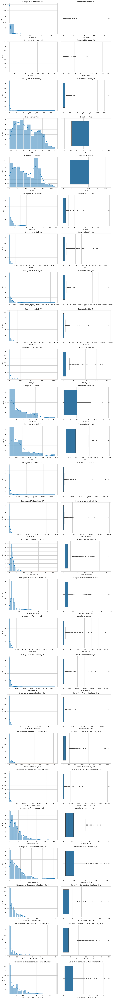

In [ ]:
columns_of_interest = ['Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Age', 'Tenure',
       'Count_MF','ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']

# Plotting for dataset
plot_histograms_boxplots(train_df, columns_of_interest)

In [ ]:
for i in ['Sex','Count_CA', 'Count_SA', 'Count_OVD', 'Count_CC', 'Count_CL','TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']:
  counts = countuniquevalues_categorical(train_df,i)
  print(counts)

Sex
M    487
F    420
Name: count, dtype: int64
Count_CA
1    854
2     40
3     14
4      1
Name: count, dtype: int64
Count_SA
1.0    211
2.0     30
3.0      8
Name: count, dtype: int64
Count_OVD
1.0    235
Name: count, dtype: int64
Count_CC
1.0    102
Name: count, dtype: int64
Count_CL
1.0    65
2.0     9
Name: count, dtype: int64
TransactionsDeb
1.0     55
6.0     46
3.0     44
4.0     41
2.0     40
        ..
58.0     1
75.0     1
63.0     1
60.0     1
76.0     1
Name: count, Length: 78, dtype: int64
TransactionsDeb_CA
1.0     65
3.0     46
4.0     46
2.0     41
9.0     39
        ..
79.0     1
68.0     1
74.0     1
43.0     1
63.0     1
Name: count, Length: 63, dtype: int64
TransactionsDebCash_Card
0.0     340
1.0     164
2.0     118
3.0      86
4.0      54
6.0      39
5.0      31
7.0      24
8.0      11
12.0      6
9.0       5
10.0      5
11.0      3
16.0      2
21.0      1
13.0      1
25.0      1
Name: count, dtype: int64
TransactionsDebCashless_Card
0.0     382
1.0      60
2.0 

# **Analysis 2**
**Numerical Column Distribution Plot and Identify outliers using Boxplot**
1. The mean age is around 45 years and data contains members of age 20 to 70 years
2. The mean tenure is around 100 months

3. Other columns like 'Count_CA', 'Count_SA', 'Count_OVD', 'Count_CC', 'Count_CL','TransactionsDeb', 'TransactionsDeb_CA','TransactionsDebCash_Card', 'TransactionsDebCashless_Card','TransactionsDeb_PaymentOrder' - From the values and distribution its understood that they can be categorical columns indicating the count of accounts, transactions
4. Columns 'TransactionsDeb', 'TransactionsDeb_CA','TransactionsDebCash_Card', 'TransactionsDebCashless_Card','TransactionsDeb_PaymentOrder' have outliers
       TransactionsDeb - Members have more than 50 debit transactions in a month
       TransactionsDeb_CA - Members have more than 7 debit transactions from current account
       TransactionsDebCash_Card - Members have more than 14 debit transactions using cash card
       TransactionsDebCashless_Card - Members have more than 18 debit transactions cashless
       TransactionsDeb_PaymentOrder - Members have more than 18 debit transactions via payment order


# **Check null values in columns (iterative code) - Missing Values**

In [ ]:
for i in train_df.columns:
  nullcount = train_df[i].isnull().sum()
  if nullcount>0 :
    print("Column "+str(i)+" contains null values")
    print("Null value % is "+ str((nullcount/train_df.shape[0])*100))
    print()
  else:
    print("Column "+str(i)+" does not contain null values")

Column Client does not contain null values
Column Sale_MF does not contain null values
Column Sale_CC does not contain null values
Column Sale_CL does not contain null values
Column Revenue_MF does not contain null values
Column Revenue_CC does not contain null values
Column Revenue_CL does not contain null values
Column Sex contains null values
Null value % is 0.22002200220022

Column Age does not contain null values
Column Tenure does not contain null values
Column Count_CA does not contain null values
Column Count_SA contains null values
Null value % is 72.60726072607261

Column Count_MF contains null values
Null value % is 80.85808580858085

Column Count_OVD contains null values
Null value % is 74.14741474147415

Column Count_CC contains null values
Null value % is 88.77887788778878

Column Count_CL contains null values
Null value % is 91.85918591859186

Column ActBal_CA does not contain null values
Column ActBal_SA contains null values
Null value % is 72.60726072607261

Column Act

#**Multivariate Analysis of numerical and categorical columns**

In [ ]:
def multivariate_analysis(data:pd.DataFrame,method):
  # Find the pearson correlations matrix
  corr = data.corr(method = method)
  return corr

In [ ]:
data_num = train_df[['Revenue_MF', 'Revenue_CC',
       'Revenue_CL', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
       'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
       'VolumeCred', 'VolumeCred_CA', 'TransactionsCred',
       'TransactionsCred_CA', 'VolumeDeb', 'VolumeDeb_CA',
       'VolumeDebCash_Card', 'VolumeDebCashless_Card',
       'VolumeDeb_PaymentOrder', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']]
corr = multivariate_analysis(data_num,'spearman')
corr

,Revenue_MF,Revenue_CC,Revenue_CL,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,Count_CL,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CC,ActBal_CL,VolumeCred,VolumeCred_CA,TransactionsCred,TransactionsCred_CA,VolumeDeb,VolumeDeb_CA,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_CA,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder
Revenue_MF,1.000000,-0.028421,-0.020884,-0.037118,0.007618,0.026207,-0.019367,0.199833,NaN,NaN,-0.154823,-0.071228,-0.020072,-0.138789,0.000012,-0.003533,-0.121110,0.051284,0.058994,0.043999,0.073140,-0.003515,-0.007166,-0.032019,-0.000047,0.021366,0.006596,0.000851,-0.024149,0.024984,0.013802
Revenue_CC,-0.028421,1.000000,0.006544,0.029426,0.011393,-0.023835,0.004645,-0.071394,NaN,NaN,-0.048153,0.029417,0.157250,-0.051594,-0.081279,0.004862,0.016813,-0.030379,-0.037382,0.028580,-0.017843,-0.010746,-0.014232,-0.015992,-0.030635,-0.003727,0.015748,0.013433,0.011363,-0.031181,0.006922
Revenue_CL,-0.020884,0.006544,1.000000,-0.141981,0.151301,0.087413,0.167661,0.009081,NaN,NaN,0.152106,-0.058259,-0.031202,0.032653,0.054721,-0.220554,0.095547,0.028845,0.018290,0.040970,0.056600,0.068703,0.068043,0.044459,0.011461,0.035666,0.049706,0.054242,0.064899,0.021927,0.013919
Age,-0.037118,0.029426,-0.141981,1.000000,-0.031260,0.014793,0.053946,-0.014951,NaN,NaN,-0.156867,-0.046075,0.048826,0.009207,0.043338,0.101524,0.049133,0.030187,0.026494,0.079693,0.046786,0.034917,0.035452,-0.016198,0.030037,0.033046,0.024147,0.016247,-0.024324,0.014648,0.054811
Tenure,0.007618,0.011393,0.151301,-0.031260,1.000000,0.031421,-0.043872,-0.046221,NaN,NaN,-0.132627,0.014302,-0.043370,0.016015,0.029394,-0.050510,-0.072542,-0.025507,-0.031960,0.007736,-0.000889,-0.025730,-0.020128,-0.016127,0.017344,0.002404,0.009530,0.011346,-0.026643,0.036433,0.017305
Count_CA,0.026207,-0.023835,0.087413,0.014793,0.031421,1.000000,0.101439,-0.128154,NaN,NaN,-0.100128,0.044395,0.050365,0.112534,0.007826,0.094335,-0.057949,-0.041229,-0.049087,-0.022829,-0.007403,-0.038051,-0.052081,-0.058893,-0.041743,-0.024103,-0.004381,-0.003966,-0.040353,-0.023868,0.004735
Count_SA,-0.019367,0.004645,0.167661,0.053946,-0.043872,0.101439,1.000000,-0.041549,NaN,NaN,NaN,-0.000506,-0.004012,-0.025255,-0.051226,-0.106623,-0.194325,-0.107482,-0.104687,-0.008863,-0.027829,-0.091109,-0.117748,-0.057504,-0.039014,-0.104575,-0.030760,-0.068899,-0.059186,-0.039163,-0.043463
Count_MF,0.199833,-0.071394,0.009081,-0.014951,-0.046221,-0.128154,-0.041549,1.000000,NaN,NaN,NaN,-0.129304,-0.048896,-0.105719,-0.096151,-0.028816,-0.028989,-0.019482,0.002078,-0.014535,-0.023397,-0.012033,-0.027448,-0.020539,-0.004275,-0.021880,-0.035302,-0.027125,-0.034095,0.010078,-0.047264
Count_OVD,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Count_CC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


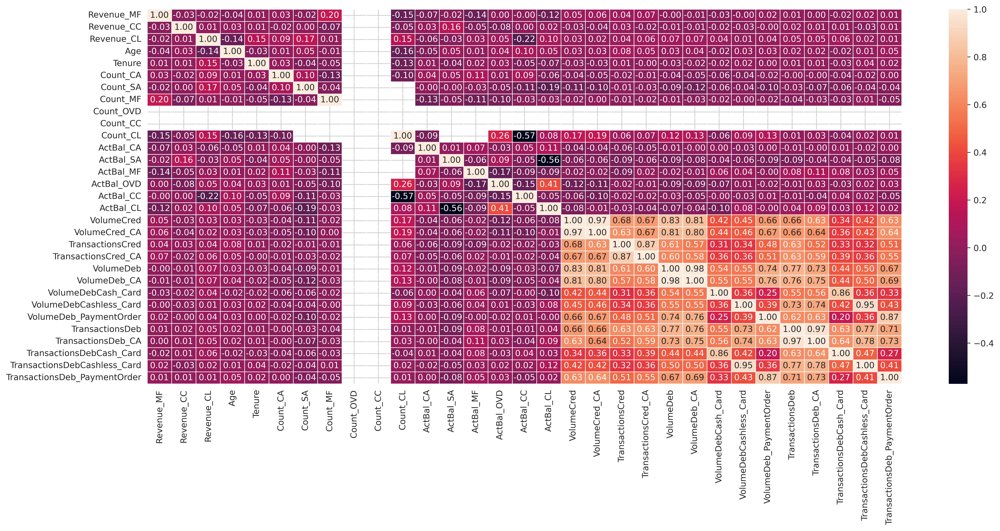

In [ ]:
plt.figure(figsize=(20,8), dpi =500)
sns.heatmap(corr,annot=True,fmt=".2f", linewidth=.5)
plt.show()

# **Analysis 3**
##**Get the correlation matrix. Understand whether features are correlated with each other as well as correlated with the target variable.**
a. To test the correlation between numerical variables,  can use pearsons coefficient/ spearman \. Spearman is used mainly if the continuous variables are not normally distributed and if they have outliers. Since our data points are not normally distributed, we will use spearmans coefficient.
b. To test the correlation between categorical variables, can use chi square test \
c. Since the target variable is categorical and label encoded and is derived from revenue numerical variables, the correlation of numerical variables with the target variable can be checked using pearsons coefficient

1. None of the numerical variables are highly correlated with the revenue target variables.

2. VolumeCred is highly correlated with VolumeCreditCA;hence VolumeCreditCA can be removed since VolumeCred column captures the information.
3. Similarly TransactionsCred is highly correlated with TransactionsCreditCA;hence TransactionsCreditCA can be removed since TransactionsCredit column captures the information.

4. Similarly VolumeDeb is highly correlated with VolumeDebCA;hence VolumeDebCA can be removed since VolumeDeb column captures the information.

5. Similarly TransactionsDeb is highly correlated with TransactionsDebCA;hence TransactionsDebCA can be removed since TransactionsDeb column captures the information.

6. Eventhough VolumeDebCash_Card,VolumeDebCashless_Card,
VolumeDeb_PaymentOrder are 70 to 80% correlated with VolumeDeb, need not remove them since it could provide insights about the transactions on card.

7. Similarly TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder are 70 to 80% correlated with TransactionsDeb,need not remove them since it could provide insights about the transactions on card

8. VolumeCred is highly correlated with VolumeDeb, but can keep for good model interpretation.


In [ ]:
objlist = ['Sale_MF', 'Sale_CC', 'Sale_CL', 'Sex', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'TransactionsCred',
       'TransactionsCred_CA', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder']

In [ ]:
from scipy.stats import chi2_contingency
# Defining a function to perform the Chi-Square Test and interpret results
def perform_chi_square_test(data, col1, col2):
    # Creating a contingency table
    contingency_table = pd.crosstab(data[col1], data[col2])

    # Performing the Chi-Square Test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Interpreting the result
    significant = p < 0.05  # 5% significance level
    return chi2, p, significant

for i in objlist:
  for j in objlist:
    if i!=j:
      chi2, p, sig = perform_chi_square_test(train_df, *(i,j))
      if sig==True:
        print("Chi square test between "+i+" & "+j)
        print(chi2,p,sig)
        print()
        print()

Chi square test between Sale_MF & TransactionsDeb
101.8608072284684 0.030503360863958374 True


Chi square test between Sale_MF & TransactionsDeb_CA
84.0205162662861 0.03282917809417258 True


Chi square test between Sale_MF & TransactionsDebCashless_Card
79.47006376275398 0.0005983103646091616 True


Chi square test between Sale_CL & Count_CA
10.261246334710139 0.016471124788766736 True


Chi square test between Sale_CL & Count_SA
12.191516288064498 0.002252401848211094 True


Chi square test between Sale_CL & TransactionsDeb_PaymentOrder
44.800144008998075 0.01706754750818458 True


Chi square test between Sex & TransactionsCred
56.336794142065735 0.02802223624589617 True


Chi square test between Sex & TransactionsDeb
102.21036646546102 0.02892524816177495 True


Chi square test between Sex & TransactionsDeb_CA
84.84356184479005 0.02865017291068121 True


Chi square test between Count_CA & Sale_CL
10.261246334710137 0.016471124788766743 True


Chi square test between Count_SA & Sale

# **Analysis 4**
Chi Square test for categorical variables \
Some of the numerical variables can be considered categorical due to the limited number of values they have and they can be ordinal since they represent count.
The p value is less than 0.05 for all the columns.Hence they reject the hypothesis of saying that there is no relation between the variables. Therefore we can say that

*    'Sale_MF', 'Sale_CC', 'Sale_CL', 'Sex', 'Count_CA', 'Count_SA',
       'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'TransactionsCred',
       'TransactionsCred_CA', 'TransactionsDeb', 'TransactionsDeb_CA',
       'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
       'TransactionsDeb_PaymentOrder' are correlated with each other.

# **Insights**
Based on chi square test, the above categorical columns have a correlation with other categorical columns. If these columns are not removed, it wouldnt reduce the predictive power of the model built. But as part of model interpretation it would be good to keep them.


# **Final Conclusion on Univariate and Multivariate Analysis**
Based on the above univariate and multivariate analysis, certain columns need to be retained and certain columns to be dropped. Can also use univariate feature selector functions to do the same analysis where features are automatically selected using methodologies like chisquare,anova etc. But this is applicable if the no of features is too high (more than 100) and then it is required to select the top N features

#**Deep dive can be done by analysing the different group of members.**
1. Members with ConsumerLoan
2. Members with CreditCard
3. Members with Mutual Fund

In [ ]:
train_data_cc.shape[0],train_data_cl.shape[0],train_data_mf.shape[0]

(909, 909, 909)

No of members with mutual fund Sale_MF \
0    727 \
1    182 \

No of members with consumer loan Sale_CL \
0    651 \
1    258 \

No of members with credit card Sale_CC \
0    677 \
1    232 \

## **Credit Card Group**

In [ ]:
tr_cc_1 = train_data_cc[train_data_cc["Sale_CC"]==1]
tr_cc_0 = train_data_cc[train_data_cc["Sale_CC"]==0]

The statistical description of the dataset
            Client  Sale_CC         Age      Tenure    Count_CA   Count_SA  \
count   232.000000    232.0  232.000000  232.000000  232.000000  83.000000   
mean    815.797414      1.0   46.172414  101.051724    1.060345   1.192771   
std     453.411663      0.0   16.965601   65.984039    0.272516   0.480290   
min      20.000000      1.0   18.000000    0.000000    1.000000   1.000000   
25%     448.750000      1.0   32.000000   43.750000    1.000000   1.000000   
50%     834.500000      1.0   43.000000   94.500000    1.000000   1.000000   
75%    1207.000000      1.0   60.000000  151.000000    1.000000   1.000000   
max    1600.000000      1.0   90.000000  271.000000    3.000000   3.000000   

        Count_MF  Count_OVD  Count_CC   Count_CL     ActBal_CA      ActBal_SA  \
count  47.000000       69.0      24.0  13.000000    232.000000      83.000000   
mean    3.702128        1.0       1.0   1.076923   4421.005463   24733.376657   
std     4.9

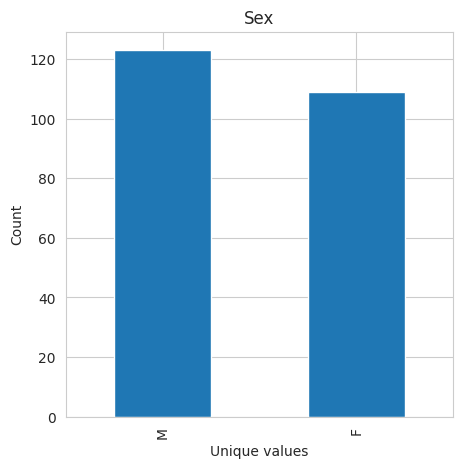

[{'Sex': 'M'}]


In [ ]:
datadescribe(tr_cc_1)
count_list = plot_column_value_counts(tr_cc_1)
print(count_list)

#**Insights of Credit Card buyer members**
1. Mean age is 46 years. Most of members who enrolled to get credit card are between 31 to 60 years of age. More demand among members having age from 31 to 45 years including old members above 50 years. \
2. Mean Tenure of members with the bank is 102 months. The tenure ranges between 45 to 151 months.
3. Out of 232 members to whom credit cards have been sold and revenue was incurred \
  a. all members have current account,\
  b. 83 members have savings account,\
  c. 47 members have mutual fund,\
  d. 69 members have live overdrafts \
  d. 24 members had live credit cards, \
  e. 13 members had consumer loan. \
  f. 227 members had avg monthly credit turnover of 2k and avg of 6 monthly credit transactions. But these members had an avg monthly debit of more than 2k and avg of 16 monthly debit transactions. This indicates they spend more than they credit.\
  g. Most of the members have less balance in CA account with an avg of 4k euros. The balance ranges from 57 to 3k with few outliers of having more than 10k balance \
  h. 83 members having savings account of which they maintain a balance of an average of 24k and few outliers having balance above 50k. \
  i. ActBal_MF - Members have an average of 11k euros in mutual fund with outlier members having 50k to 200k euros \
  j. Actual OVD - Members have an average of 104 euros- dont have much overdraft balance \
  k. 'ActBal_CC' - Members have mostly between 0 and 500 euros \
  l. 'ActBal_CL' - Members have mostly CL balance of 1000 to 5k euros and members in the 90th percentile having balance of 5000 to 12000 euros.\
  m. The amount debited via payment order is more than 1000 euros. \
  n. Average of 2 and 4 transactions using cash, cashless card and payment order among which there are outliers.

4. Equal number of male and female members have credit card.
      


# **Consumer Loan group**

In [ ]:
tr_cl_1 = train_data_cl[train_data_cl["Sale_CL"]==1]
tr_cl_0 = train_data_cl[train_data_cl["Sale_CL"]==0]

The statistical description of the dataset
            Client  Sale_CL         Age      Tenure    Count_CA   Count_SA  \
count   258.000000    258.0  258.000000  258.000000  258.000000  75.000000   
mean    837.627907      1.0   41.500000  116.728682    1.131783   1.253333   
std     461.112317      0.0   17.111047   69.377583    0.447733   0.467695   
min      22.000000      1.0   19.000000    0.000000    1.000000   1.000000   
25%     448.500000      1.0   27.000000   55.000000    1.000000   1.000000   
50%     842.000000      1.0   37.000000  128.000000    1.000000   1.000000   
75%    1244.000000      1.0   52.000000  171.750000    1.000000   1.000000   
max    1600.000000      1.0   87.000000  260.000000    4.000000   3.000000   

        Count_MF  Count_OVD  Count_CC   Count_CL     ActBal_CA     ActBal_SA  \
count  56.000000       74.0      29.0  28.000000    258.000000     75.000000   
mean    4.303571        1.0       1.0   1.178571   2066.627414   9486.847790   
std     5.3696

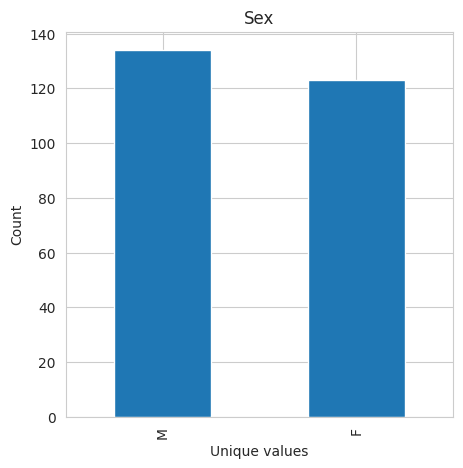

[{'Sex': 'M'}]


In [ ]:
datadescribe(tr_cl_1)
count_list = plot_column_value_counts(tr_cl_1)
print(count_list)

# **Insights of Consumer Loan members**
1. Mean age is 41 years. Most of members who have taken consumer loan are between 27 to 52 years of age. More demand among young members of age 27 to 37 and middle aged people from 40 to 50\
2. Mean Tenure of members with the bank is 118 months. The tenure ranges between 55 to 171 months
3. Out of 258 members who have taken consumer loan and corresponding revenue was incurred by bank\
  a. all members have current account,\
  b. 75 members have savings account,\
  c. 56 members have mutual fund,\
  d. 74 members have live overdrafts \
  d. 29 members had live credit cards, \
  e. 28 members had live consumer loan. \
  f. 257 members had avg monthly credit turnover of 2k and avg of 6 monthly credit transactions. But these members had an avg monthly debit of more than 2k and avg of 18 monthly debit transactions. This indicates they spend more than they credit.\

  g. Most of the members have less balance in CA account with an average of 2k. The balance ranges from 46 to 2k with few outliers of having more than 10k balance \

  h. 75 members having savings account of which they maintain a balance of an average of 10k(less than credit card holders) and few outliers having balance above 1lakh. \

  From point g and h, the consumer loan members have less balance compared to credit card holders. \

  i. ActBal_MF - Members have an average of 36k euros in mutual fund with outlier members having upto 700k euros \

  j. Actual OVD - Members have an average of 197 euros- dont have much overdraft balance \

  k. 'ActBal_CC' - Members have mostly between 0 and 800 euros \

  l. 'ActBal_CL' - Members have mostly CL balance of 4k to 12k euros.\

  m. The amount debited via cash, cashless or payment order is less than 1000 \
  
  n. Average of 2 and 5 transactions using cash, cashless card and payment order among which there are outliers.

4. Equal number of male and female members have taken consumer loan

# **Mutual Fund group**

In [ ]:
tr_mf_1 = train_data_mf[train_data_mf["Sale_MF"]==1]
tr_mf_0 = train_data_mf[train_data_mf["Sale_MF"]==0]

The statistical description of the dataset
            Client  Sale_MF         Age      Tenure    Count_CA  Count_SA  \
count   182.000000    182.0  182.000000  182.000000  182.000000  54.00000   
mean    824.692308      1.0   43.741758  100.368132    1.082418   1.12963   
std     459.931467      0.0   15.468175   63.614270    0.313277   0.33905   
min       1.000000      1.0   19.000000    0.000000    1.000000   1.00000   
25%     481.250000      1.0   32.000000   48.250000    1.000000   1.00000   
50%     873.500000      1.0   41.000000   92.000000    1.000000   1.00000   
75%    1227.500000      1.0   55.750000  151.000000    1.000000   1.00000   
max    1613.000000      1.0   84.000000  263.000000    3.000000   2.00000   

        Count_MF  Count_OVD  Count_CC  Count_CL     ActBal_CA     ActBal_SA  \
count  48.000000       46.0      20.0      11.0    182.000000     54.000000   
mean    7.729167        1.0       1.0       1.0   1980.836389   9385.461369   
std    13.042875        0.

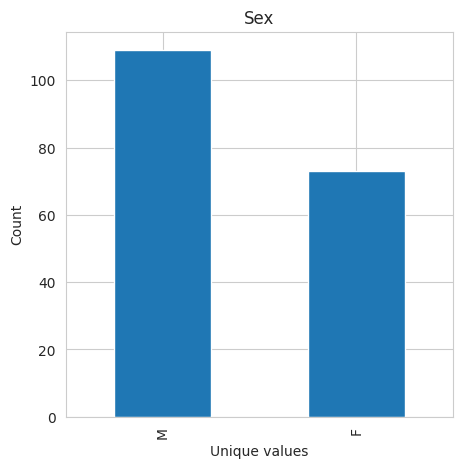

[{'Sex': 'M'}]


In [ ]:
datadescribe(tr_mf_1)
count_list = plot_column_value_counts(tr_mf_1)
print(count_list)

# **Insights of Mutual Fund group members**
1. Mean age is 43 years. Most of the members range from 32 to 53 years old
2. Mean Tenure of members with the bank is 99 months. The tenure ranges between 48 to 151 months
3. Out of 182 members who have taken mutual fund and corresponding revenue was incurred by bank\
  a. all members have current account,\
  b. 54 members have savings account,\
  c. 48 members have mutual fund,\
  d. 46 members have live overdrafts - comparitively less than other group members \
  d. 20 members had live credit cards, \
  e. 11 members had live consumer loan. \
  f. 182 members had avg monthly credit turnover of 1820 and avg of 6 monthly credit transactions eventhough these members had an avg monthly debit of around 1384 and avg of 19 monthly debit transactions. This indicates they spend less than their credit. \

  g. Most of the members have less balance in CA account with an average of 2k. \

  h. 54 members having savings account of which they maintain a balance of an average of 10k and few outliers having balance above 1lakh. \

  From point g and h, the consumer loan members have less balance compared to credit card holders. \

  i. ActBal_MF - Members have an average of 22k euros in mutual fund with outlier members having upto 500k euros \

  j. Actual OVD - Members dont have much overdraft balance \

  k. 'ActBal_CC' - Members have mostly between -ve balance to and 530 euros \

  l. 'ActBal_CL' - Members have mostly CL balance of 1k to 9k euros.\

  m. The amount debited via cash, cashless or payment order is less than 700 \

  n. Average of 2 7 and 4 transactions using cash, cashless card and payment order.

4. We can see that female members are less who have mutual fund compared to female members who have credit cards and consumer loans. Educating and guiding more female members about the importance and benefits of Mutual fund required. Hence female members can be focused for getting sales in mutual funds.

# **Model Building**
3 models
1. Credit Card
2. Consumer Loan
3. Mutual Fund

# Iteration1
1. Drop columns VolumeDebCA,Transaction DebCA,volume credit CA, transaction credit CA
2. Fill NAN values with 0
3. Save target column in separate variable
4. Split train test
5. Scale the data

In [ ]:
df_names = ['train_data_cc', 'train_data_cl', 'train_data_mf']

for df_name in df_names:
  df = eval(df_name)  # Get the DataFrame object from the name
  df = df.drop(columns =['TransactionsCred_CA', 'VolumeDeb_CA','TransactionsDeb_CA','VolumeCred_CA'],axis =1)
  exec(f"{df_name} = df")

In [ ]:
df_names = ['train_data_cc', 'train_data_cl', 'train_data_mf']

for df_name in df_names:
  df = eval(df_name)  # Get the DataFrame object from the name
  for column in df.columns:
    if df[column].dtype == 'object' and column!='Client':
      df = pd.get_dummies(df, columns=[column], prefix=[column])
  exec(f"{df_name} = df")

In [ ]:
for df_name in df_names:
  df = eval(df_name)  # Get the DataFrame object from the name
  for column in df.columns:
    df['Sex_F'] = df['Sex_F'].replace({False: 0, True: 1})
    df['Sex_M'] = df['Sex_M'].replace({False: 0, True: 1})
  exec(f"{df_name} = df")


<ipython-input-42-3fd0d9247564>:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Sex_F'] = df['Sex_F'].replace({False: 0, True: 1})
<ipython-input-42-3fd0d9247564>:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Sex_M'] = df['Sex_M'].replace({False: 0, True: 1})


In [ ]:
df_names = ['train_data_cc', 'train_data_cl', 'train_data_mf']

for df_name in df_names:
  df = eval(df_name)  # Get the DataFrame object from the name
  df.fillna(0, inplace=True)
  exec(f"{df_name} = df")


# **Model 1 - Credit Card**

In [ ]:
# Need to remove some credit card related features since they wouldnt be available to new members
# 1. 'Count_CC'
# 2. 'ActBal_CC'
# 3. 'VolumeDebCash_Card'
# 4. 'VolumeDebCashless_Card'
# 'TransactionsDebCash_Card', 'TransactionsDebCashless_Card'

## Modular functions for Modeling and Evaluation

In [ ]:
def modeldata(data,columns,target):
  finalcolumn = columns+target
  X= data.drop(finalcolumn,axis =1)
  y = data[target]
  feature_names = X.columns
  return X,y,feature_names

def computeweightxgboost(Y_train):
  classes_weights = compute_sample_weight(
    class_weight='balanced',
    y=Y_train
)
  return classes_weights

def traintestsplit(X,y,test_size):
  X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=test_size, random_state=77)
  print(X_train.shape,X_test.shape)
  return X_train, X_test, Y_train, Y_test

def scale(X_train,X_test):
  scaler = StandardScaler()
  X_train_scaled = scaler.fit_transform(X_train)
  X_test_scaled = scaler.transform(X_test)
  return X_train_scaled,X_test_scaled


In [ ]:
columns = ['Count_CC','ActBal_CC','VolumeDebCash_Card','VolumeDebCashless_Card','TransactionsDebCash_Card','TransactionsDebCashless_Card']
target = ['Sale_CC']
X,y,feature_names = modeldata(train_data_cc,columns, target)

test_size = 0.4
X_train, X_test, Y_train, Y_test = traintestsplit(X,y,test_size)
X_train_noclient = X_train.drop('Client', axis=1)
X_test_noclient = X_test.drop('Client', axis=1)

X_train_scaled,X_test_scaled = scale(X_train_noclient,X_test_noclient)

(545, 21) (364, 21)


# **Analysis**
The classes in the dataset are imbalanced, hence they need to be balanced by creating proper class weights. This is also done using the class weight functionality of sklearn algorithms. Here I would be using Logistic Regression, Random Forest and XGBoost Classifiers. Both are ensemble methods which would give good results

Here we need to focus on precision since we need the model to predict the likelihood of purchase for consumer loan, credit card or mutual fund. Precision focuses on the model to correctly identify the right person who would buy a conusmerloan/creditcard/mutual fund based on their demographics and financial transactions.

In [ ]:
def logistic_reg_train(X_train_scaled,Y_train,X_test_scaled,Y_test):
  clf_lr =  LogisticRegression(random_state=77,solver='liblinear',class_weight="balanced")

  # Training the model
  clf_lr.fit(X_train_scaled,Y_train.values.ravel())

  # Predictions
  y_pred_lr = clf_lr.predict(X_test_scaled)

  return clf_lr,y_pred_lr

def metrics(Y_test,y_pred_lr):

  # Calculate metrics

  print(classification_report(Y_test, y_pred_lr))

  print(confusion_matrix(Y_test,y_pred_lr))
  print()
  return

def extractlr_coefficients(model,X_test):
  # Extract coefficients
  coefficients = model.coef_
  print(coefficients)
  # Display feature importance
  print("Feature Importance (absolute coefficients):")
  for i, class_coefficients in enumerate(coefficients):
      print(f"\nClass 1:")
      importance = np.abs(class_coefficients)
      importance_sorted_idx = importance.argsort()[::-1]  # Sort features by importance
      feature_names = X_test.columns
      for idx in importance_sorted_idx:
          print(f"{feature_names[idx]}: {importance[idx]}")

def compute_best_threshold(Y_test,X_test_scaled,model,steps):
  # Getting the probability scores from the logistic regression model for class 1
  probabilities = model.predict_proba(X_test_scaled)[:, 1]

  # Define thresholds from 0.1 to 0.9
  thresholds = np.arange(0.1, 1.0, steps)

  # Store results
  results = []

  for threshold in thresholds:
      preds = (probabilities >= threshold).astype(int)  # Convert probabilities to class labels
      precision = precision_score(Y_test, preds)
      recall = recall_score(Y_test, preds)

      results.append({"Threshold": threshold, "Precision": precision, "Recall": recall})

  # Convert to DataFrame
  results_pr = pd.DataFrame(results)

  # Display results
  print(results_pr)

  return probabilities,results_pr

def pr_plot(results_pr):

  plt.plot(results_pr["Threshold"], results_pr["Precision"], label="Precision", marker="o")
  plt.plot(results_pr["Threshold"], results_pr["Recall"], label="Recall", marker="s")
  plt.xlabel("Threshold")
  plt.ylabel("Score")
  plt.legend()
  plt.title("Precision-Recall vs. Threshold")
  plt.show()

def pred_bestthreshold(probabilities,threshold):

  new_y_pred_lr = (probabilities >= threshold).astype(int)
  return new_y_pred_lr

def randomforest_train(X_train_scaled,Y_train,X_test_scaled,Y_test,param_grid,metric):
  # Define the model
  rf_model = RandomForestClassifier()

  # Perform grid search with cross-validation
  grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, scoring=metric)
  grid_search_rf.fit(X_train, Y_train.values.ravel())

  # Best parameters and best score
  print("Best Hyperparameters for Random Forest:", grid_search_rf.best_params_)
  print("Best Cross-Validation Precision for Random Forest:", grid_search_rf.best_score_)

  # Get the best parameters from GridSearchCV
  best_params_rf = grid_search_rf.best_params_
  print("Best Hyperparameters for Random Forest:", best_params_rf)

  # Fit the model with the best parameters on the entire training data
  final_rf_model = RandomForestClassifier(**best_params_rf)
  final_rf_model.fit(X_train, Y_train.values.ravel())

  y_pred_rf = final_rf_model.predict(X_test)

  return final_rf_model,y_pred_rf

def randomforest_feature_importance(model,data):
  importances = model.feature_importances_
  feature_imp_df = pd.DataFrame({'Feature': data.columns, 'Gini Importance': importances}).sort_values('Gini Importance', ascending=False)
  print(feature_imp_df)
  return feature_imp_df

def plotfeatureimp(feature_imp_df):
  plt.figure(figsize=(12, 6))
  sns.barplot(x='Gini Importance', y='Feature', data=feature_imp_df, orient='h', order=feature_imp_df.sort_values('Gini Importance', ascending=False)['Feature'])
  plt.xlabel('Gini Importance')
  plt.ylabel('Features')
  plt.title('Feature Importance (Gini Importance) in Descending Order')
  plt.tight_layout()
  plt.show()
  return

def xgbtrain(Xtrain,Y_train,X_test,Y_test,classes_weights):
  xgb_clf = XGBClassifier(n_estimators = 45, max_depth =3,objective='binary:logistic',
                            early_stopping_rounds=20,
                            eval_metric=['error','logloss'],
                            seed=42)
  xgb_clf.fit(X_train,
            Y_train,
            verbose=0, # set to 1 to see xgb training round intermediate results
            sample_weight=classes_weights, # Class weight balance
            eval_set=[(X_train, Y_train), (X_test, Y_test)])
  return xgb_clf

def xgbvalidationresults(xgb_clf,X_test,Y_test):
    # preparing evaluation metric plots
    results = xgb_clf.evals_result()
    epochs = len(results['validation_0']['logloss'])
    x_axis = range(0, epochs)

    # xgboost 'logloss' plot
    fig, ax = plt.subplots(figsize=(9,5))
    ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
    ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
    ax.legend()
    plt.ylabel('logloss')
    plt.title('XGBoost logloss')
    plt.show()

    # xgboost 'error' plot
    fig, ax = plt.subplots(figsize=(9,5))
    ax.plot(x_axis, results['validation_0']['error'], label='Train')
    ax.plot(x_axis, results['validation_1']['error'], label='Test')
    ax.legend()
    plt.ylabel('error')
    plt.title('XGBoost error')
    plt.show()

    y_pred_xgb = xgb_clf.predict(X_test)
    return y_pred_xgb

def modelpredict(model,X_test):
  predictions = model.predict(X_test)
  return predictions

def xgboostplot(xgb_clf):
  fig, ax = plt.subplots(figsize=(9,5))
  xgb.plot_importance(xgb_clf, ax=ax)
  plt.show()

  plt.rcParams['figure.figsize'] = 28,12
  xgb.plot_tree(xgb_clf)
  plt.show()
  return

def shapplot(model,data,classlabel,modelname):
  if modelname =="xgb" or modelname =="rf":
    explainer = shap.TreeExplainer(model)
  elif modelname=="lr":
    explainer = shap.LinearExplainer(model, X_train)

  if modelname=="xgb" or modelname=="lr":
    shap_values = explainer.shap_values(data)
    print(shap_values.shape)
    shap.summary_plot(shap_values,data)
  else:
    # Calculate SHAP values for the train set
    shap_values = explainer.shap_values(data)
    print(shap_values.shape)
    shap.summary_plot(shap_values[:,:,classlabel],data)
  return


              precision    recall  f1-score   support

           0       0.84      0.67      0.74       284
           1       0.31      0.54      0.40        80

    accuracy                           0.64       364
   macro avg       0.58      0.60      0.57       364
weighted avg       0.72      0.64      0.67       364

[[190  94]
 [ 37  43]]

[[ 0.10689748  0.025502   -0.24621989  0.09862644 -0.12226918  0.30789394
  -0.19148667  0.45553571  0.54588608  0.034356   -0.07296461 -0.0122571
  -0.85620311 -0.10063355  0.1511474   0.67109885  0.1227319  -0.21159686
   0.40612182  0.31701577]]
Feature Importance (absolute coefficients):

Class 1:
VolumeCred: 0.8562031135262683
VolumeDeb_PaymentOrder: 0.6710988489396755
ActBal_SA: 0.5458860819854383
ActBal_CA: 0.45553571390311254
Sex_F: 0.4061218154475602
Sex_M: 0.31701576561926265
Count_OVD: 0.307893944820898
Count_CA: 0.2462198850788489
TransactionsDeb_PaymentOrder: 0.21159685630061387
Count_CL: 0.191486666407021
VolumeDeb: 0.151147404

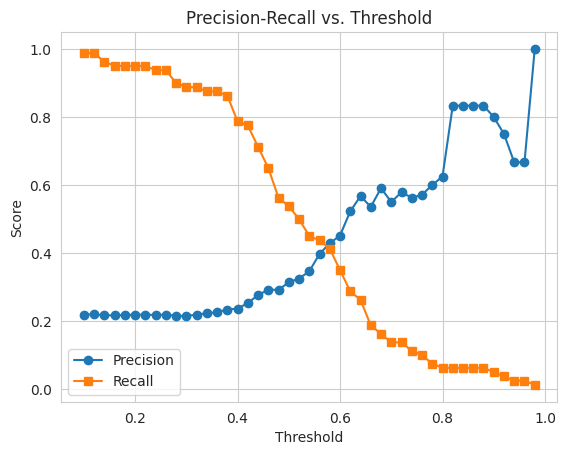

              precision    recall  f1-score   support

           0       0.84      0.85      0.84       284
           1       0.43      0.41      0.42        80

    accuracy                           0.75       364
   macro avg       0.63      0.63      0.63       364
weighted avg       0.75      0.75      0.75       364

[[240  44]
 [ 47  33]]



In [ ]:
clf_lr, y_pred_lr = logistic_reg_train(X_train_scaled,Y_train,X_test_scaled,Y_test)
metrics(Y_test,y_pred_lr)
extractlr_coefficients(clf_lr,X_test_noclient)

probabilities,results_pr = compute_best_threshold(Y_test,X_test_scaled,clf_lr,0.02)
pr_plot(results_pr)
threshold = 0.58
new_y_pred_lr = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_lr)

## Interpreting the Logistic Regression Model Coefficients for Credit Card Purchase Propensity
 ## Logistic Regression is good for model interpretability, but the precision is 43% at threshold 0.58

### 1. Most Influential Features (Higher Absolute Coefficients)
The larger the absolute coefficient, the stronger the influence on predicting credit card purchase.\

1. VolumeCred (0.8562) - Total Credited Volume
Customers with higher credited amounts (e.g., salary deposits, business income) are more likely to buy a credit card.
Regular income flow signals financial stability.Higher incomes make customers attractive for credit offers.
2. VolumeDeb_PaymentOrder (0.6711) - Debit Volume via Payment Orders
Customers who frequently pay bills or make transfers via payment orders are more likely to get a credit card.
Indicates active banking behavior.Suggests a need for better cash flow management, making credit cards useful.
3. ActBal_SA (0.5459) - Savings Account Balance
Customers with higher savings account balances are more likely to buy a credit card.Shows financial stability, making them eligible for credit products.Banks may target high-balance customers for premium cards.

### 2.Moderate Influence Factors

These features still contribute significantly but have less impact than the top predictors.

1. ActBal_CA (0.4555) - Current Account Balance
Interpretation: Higher current account balances increase the likelihood of getting a credit card.Suggests regular banking activity.
Indicates financial health and ability to manage credit.
2. Sex_F (0.4061) & Sex_M (0.3170)- Gender
Being female (Sex_F = 0.4061) slightly increases the chance of buying a credit card more than being male (Sex_M = 0.3170).Women may be more likely to engage with promotional offers.Banks may target female customers differently than males.
3. Count_OVD (0.3079) - Number of Overdrafts
Customers with more overdrafts are slightly more likely to buy a credit card.
They may have cash flow challenges, making a credit card useful.They are already credit users, making them potential credit card adopters.
4. Count_CA (0.2462) - Number of Current Accounts
More current accounts increase the likelihood of buying a credit card.
Having multiple accounts suggests financial engagement.
Customers with multiple accounts may be higher-value clients.
5. TransactionsDeb_PaymentOrder (0.2116) - Number of Debit Transactions via Payment Orders
Customers who make frequent debit transactions for payments are more likely to buy a credit card.Indicates high financial activity, which suggests a need for credit.

### 3. Lower Influence Factors

These variables still contribute but with a smaller impact.

1. Count_CL (0.1915): More consumer loans slightly increase credit card adoption. \
2. VolumeDeb (0.1511): Higher spending volume slightly increases likelihood.\
3. TransactionsDeb (0.1227): More debit transactions indicate higher financial activity.\
4. Count_MF (0.1223): More mutual fund accounts suggest financial awareness.
5. Age (0.1069): Older customers are slightly more likely to buy a credit card.
6. TransactionsCred (0.1006): More credit transactions indicate engagement with banking products.
7. Count_SA (0.0986): More savings accounts suggest financial stability.
8.ActBal_OVD (0.0730): Higher overdraft balance has minor impact.
9. ActBal_MF (0.0344): Mutual fund balances have minimal impact.
10. Tenure (0.0255): Longer banking relationships slightly increase credit card adoption.
11. ActBal_CL (0.0123): Consumer loan balances barely affect credit card purchases.

This analysis helps banks target high-volume transaction users with strong account balances for credit card offers while deprioritizing customers with frequent overdrafts or heavy mutual fund.

# Based on the above precision recall curve 0.58 threshold would give a good balance of precision and recall.
# Out of the 364 members in the validation test set, logistic regression model is able to correctly identify 33 members who were sold credit card through which the bank incurred revenue.
# Model has a precision of 43% and recall of 41% which means that the model was able to correctly identify 43% of members from the set of members predicted positive by the model.

# We have restriction of targetting only 15% of the clients

# Conclusion - Using Logistic Regression, we can understand the key factors driving credit card/consumer loan/mutual fund buying behaviour. However for maximising revenue it would be good to use a random forest or xgboost model

# Random Forest

Best Hyperparameters for Random Forest: {'class_weight': 'balanced', 'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 5}
Best Cross-Validation Precision for Random Forest: 0.616240223639162
Best Hyperparameters for Random Forest: {'class_weight': 'balanced', 'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 5}
              precision    recall  f1-score   support

           0       0.81      0.79      0.80       284
           1       0.30      0.33      0.31        80

    accuracy                           0.69       364
   macro avg       0.55      0.56      0.56       364
weighted avg       0.70      0.69      0.69       364

[[224  60]
 [ 54  26]]



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Threshold  Precision  Recall
0        0.10   0.219780  1.0000
1        0.12   0.219780  1.0000
2        0.14   0.219780  1.0000
3        0.16   0.219780  1.0000
4        0.18   0.219444  0.9875
5        0.20   0.221910  0.9875
6        0.22   0.220963  0.9750
7        0.24   0.222874  0.9500
8        0.26   0.223242  0.9125
9        0.28   0.227848  0.9000
10       0.30   0.235880  0.8875
11       0.32   0.232394  0.8250
12       0.34   0.231660  0.7500
13       0.36   0.229358  0.6250
14       0.38   0.237374  0.5875
15       0.40   0.238636  0.5250
16       0.42   0.256250  0.5125
17       0.44   0.273973  0.5000
18       0.46   0.276923  0.4500
19       0.48   0.280000  0.3500
20       0.50   0.302326  0.3250
21       0.52   0.296296  0.3000
22       0.54   0.328571  0.2875
23       0.56   0.372881  0.2750
24       0.58   0.409091  0.2250
25       0.60   0.444444  0.2000
26       0.62   0.481481  0.1625
27       0.64   0.565217  0.1625
28       0.66   0.631579  0.1500
29       0

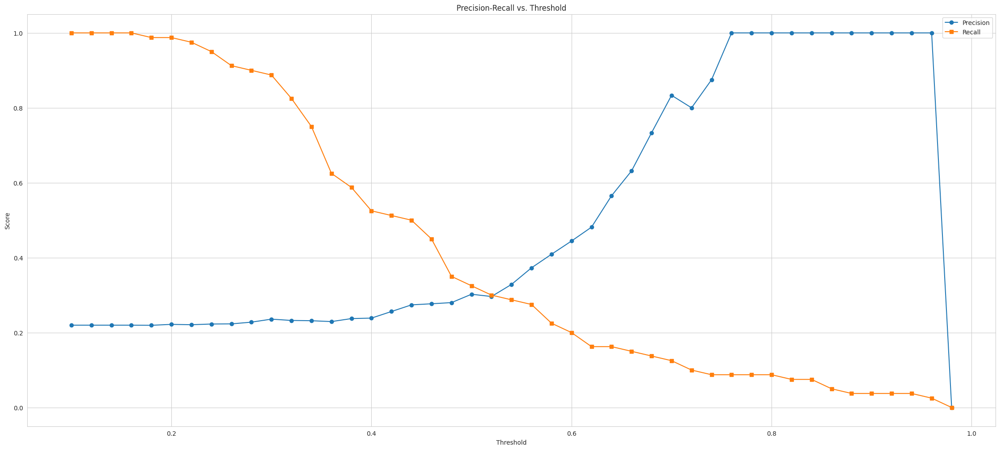

In [ ]:
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()
X_train = X_train.drop('Client', axis=1)
X_test = X_test.drop('Client', axis=1)
# Define the hyperparameters grid
param_grid = {
    'n_estimators': [5,10,40,60,80],  # Number of trees
    'max_depth': [3,5,7,8,10],       # Depth of the trees
    'min_samples_split': [2, 5, 10],   # Min samples to split node
    'min_samples_leaf': [1, 2, 4],     # Min samples at leaf node
    'class_weight': ['balanced'] # Handle class imbalance
}
clf_rf,y_pred_rf = randomforest_train(X_train,Y_train,X_test,Y_test,param_grid,"roc_auc")
metrics(Y_test,y_pred_rf)

probabilities,results_pr = compute_best_threshold(Y_test,X_test,clf_rf,0.02)
pr_plot(results_pr)


              precision    recall  f1-score   support

           0       0.79      0.84      0.82       284
           1       0.29      0.23      0.25        80

    accuracy                           0.71       364
   macro avg       0.54      0.53      0.53       364
weighted avg       0.68      0.71      0.69       364

[[239  45]
 [ 62  18]]

                         Feature  Gini Importance
7                      ActBal_CA         0.197510
12                    VolumeCred         0.128027
1                         Tenure         0.122323
15        VolumeDeb_PaymentOrder         0.081271
8                      ActBal_SA         0.080596
14                     VolumeDeb         0.075522
0                            Age         0.064082
16               TransactionsDeb         0.047052
17  TransactionsDeb_PaymentOrder         0.033559
5                      Count_OVD         0.028165
13              TransactionsCred         0.027999
3                       Count_SA         0.019920

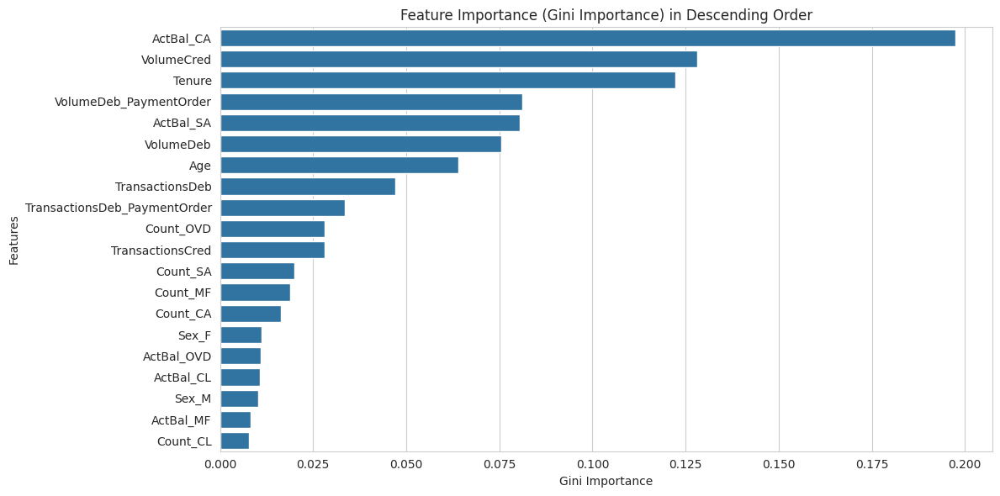

In [ ]:
threshold =0.52
new_y_pred_rf = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_rf)
auc_score = roc_auc_score(Y_test, probabilities)
auc_score
feature_imp_df=randomforest_feature_importance(clf_rf,X_test)
plotfeatureimp(feature_imp_df)

## **From this its seen that the top features predicting the classes are Actual_CA,Tenure,Actual_SA,VolumeCred,VolumeDeb, VolumeDeb_PaymentOrder. Age and TransactionsDeb have moderate impact.**

# **Feature Importance based on SHAP**

(545, 20, 2)


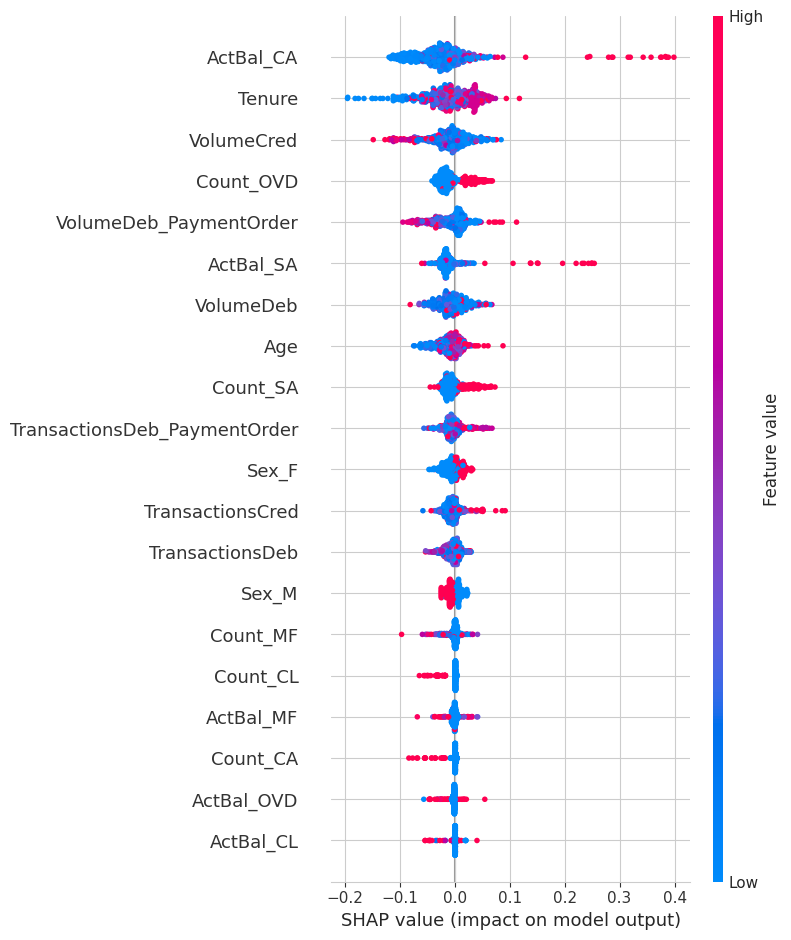

(364, 20, 2)


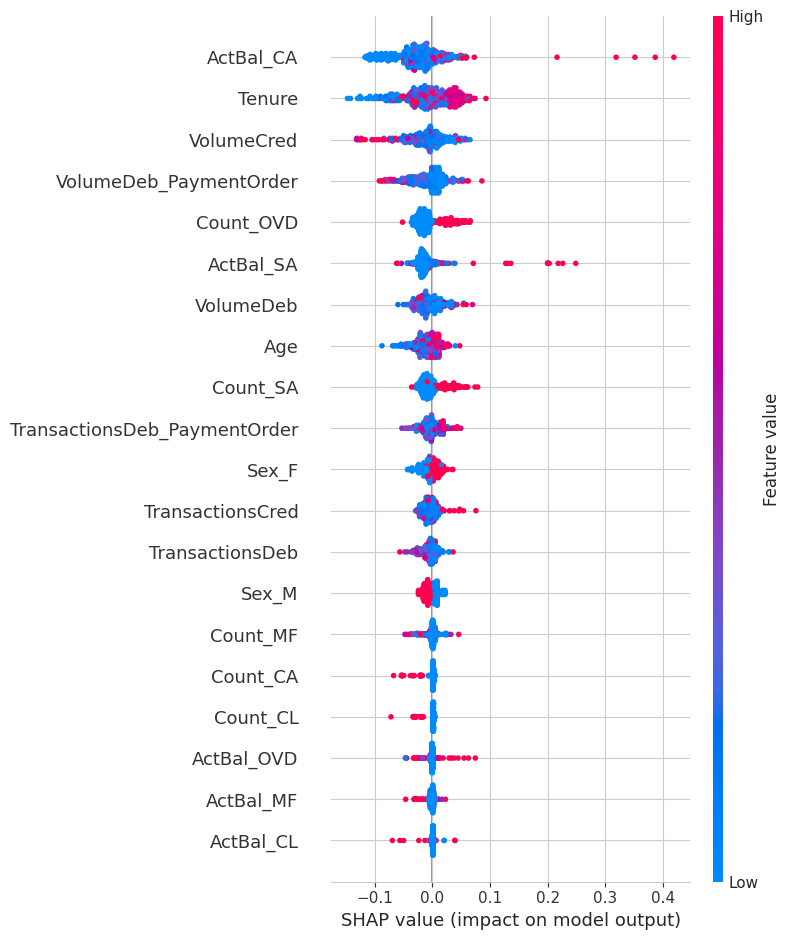

In [ ]:
shapplot(clf_rf,X_train,1,"rf")
shapplot(clf_rf,X_test,1,"rf")

#**XGBoost Classifier**

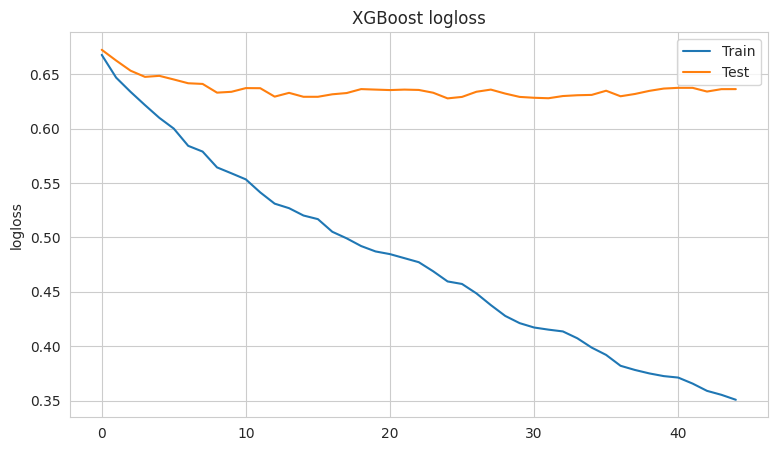

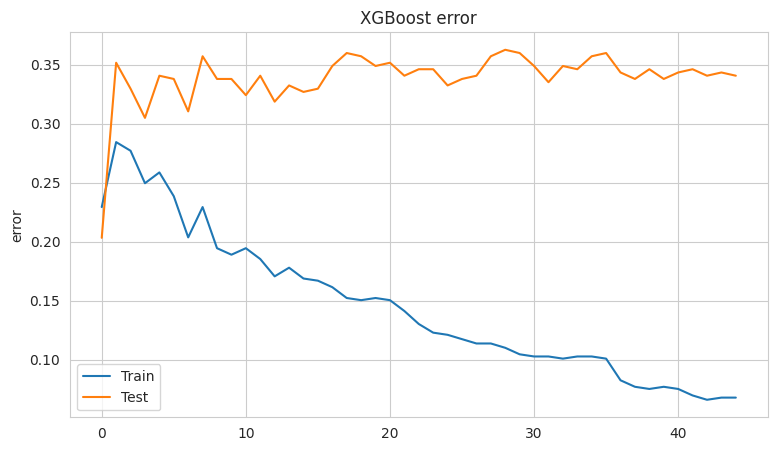

              precision    recall  f1-score   support

           0       0.82      0.74      0.78       284
           1       0.31      0.41      0.35        80

    accuracy                           0.67       364
   macro avg       0.56      0.58      0.56       364
weighted avg       0.71      0.67      0.68       364

[[210  74]
 [ 47  33]]



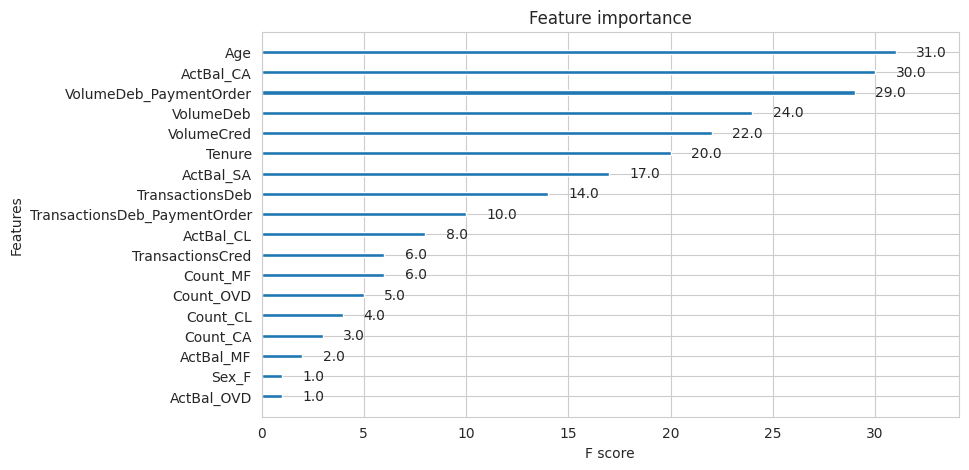

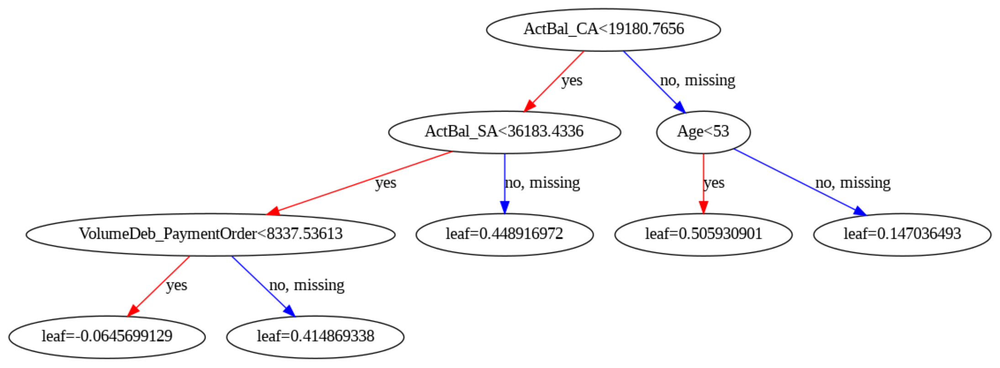

(545, 20)


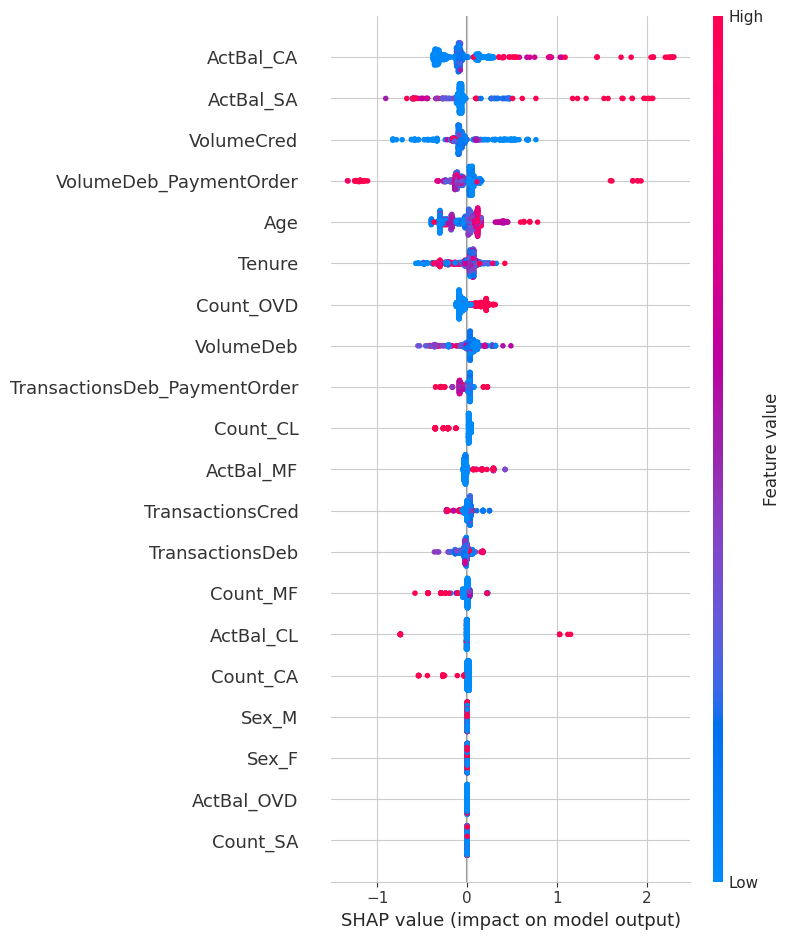

(364, 20)


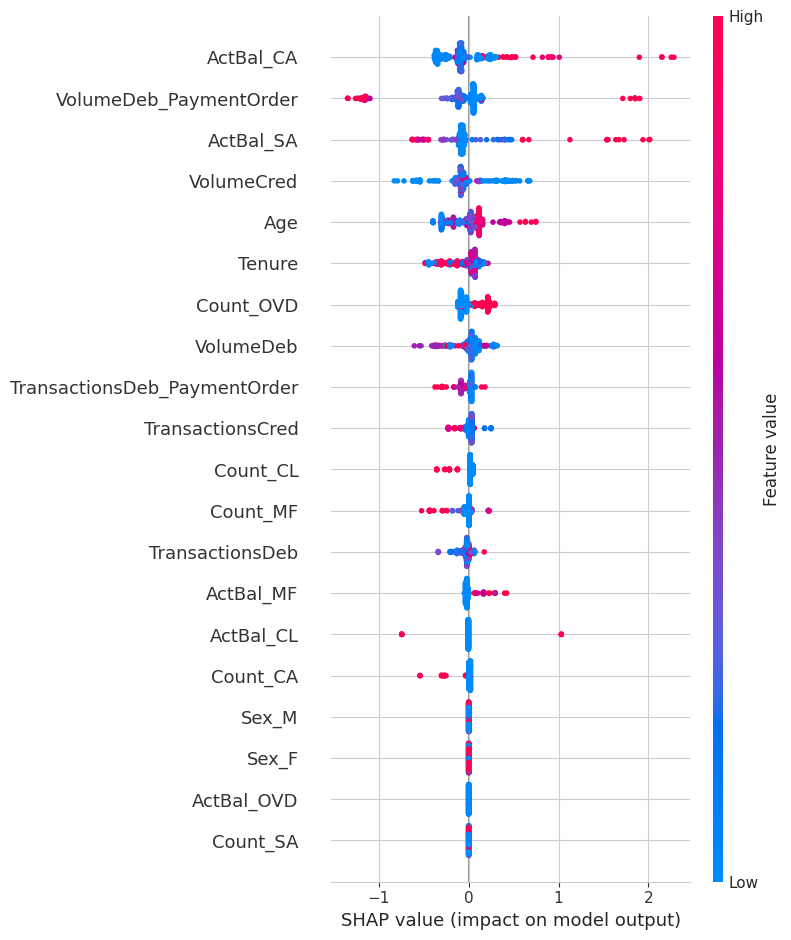

In [ ]:
classes_weights = computeweightxgboost(Y_train)
xgb_clf = xgbtrain(X_train,Y_train,X_test,Y_test,classes_weights)
y_pred_xgb = xgbvalidationresults(xgb_clf,X_test,Y_test)
metrics(Y_test,y_pred_xgb)
xgboostplot(xgb_clf)
shapplot(xgb_clf,X_train,1,"xgb")
shapplot(xgb_clf,X_test,1,"xgb")

In [ ]:
X_test_copy= X_test_copy.merge(data_sales_revenues[["Client","Revenue_CC"]], on='Client', how='left')

In [ ]:
X_test_copy.describe() # To get the mean of Revenue CC

,Client,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CL,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CL,VolumeCred,TransactionsCred,VolumeDeb,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Revenue_CC
count,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000
mean,812.510989,45.222527,95.697802,1.085165,0.299451,0.739011,0.260989,0.082418,2169.378099,3585.404573,2688.130480,60.615062,308.157042,1822.732382,5.417582,1698.351726,793.284466,16.277473,4.873626,0.467033,0.532967,2.886021
std,466.689274,16.511869,64.161658,0.349576,0.556355,2.562823,0.439778,0.312845,4337.312372,13622.633660,16322.821604,232.351485,1589.485412,6073.940663,5.937351,4276.846087,2736.396988,16.700982,5.614372,0.499599,0.499599,22.451459
min,2.000000,18.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,440.000000,32.000000,32.750000,1.000000,0.000000,0.000000,0.000000,0.000000,57.088929,0.000000,0.000000,0.000000,0.000000,266.970893,2.000000,239.033393,9.679464,4.000000,1.000000,0.000000,0.000000,0.000000
50%,800.500000,43.000000,88.000000,1.000000,0.000000,0.000000,0.000000,0.000000,591.675357,0.000000,0.000000,0.000000,0.000000,642.490000,3.500000,648.141786,200.857143,11.000000,3.000000,0.000000,1.000000,0.000000
75%,1233.000000,58.000000,151.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2266.287857,0.000000,0.000000,0.000000,0.000000,1398.774643,6.000000,1454.710446,544.375000,22.000000,7.000000,1.000000,1.000000,0.000000
max,1608.000000,88.000000,252.000000,3.000000,3.000000,26.000000,1.000000,2.000000,33573.151786,173499.862857,202941.608929,1776.065357,17062.324286,98717.675000,63.000000,44782.186071,30069.696429,96.000000,34.000000,1.000000,1.000000,407.962500


In [ ]:
# Computing the profit associated with different thresholds

import numpy as np

# We have validation labels (y_val_true) and predicted probabilities (y_val_probs)
# The average credit card revenue across the validation dataset is 2.88, so assuming the marketing cost per customer to be 2 euro

def compute_profit(threshold, y_true, y_probs, customer_revenue, marketing_cost=2):
    preds = (y_probs >= threshold).astype(int)  # Apply threshold
    TP = (preds == 1) & (y_true == 1)  # True Positives
    FP = (preds == 1) & (y_true == 0)  # False Positives
    # Total revenue from predicted buyers
    total_revenue = np.sum(customer_revenue[TP])

    # Total marketing cost (includes both TP and FP)
    total_cost = np.sum(marketing_cost * (TP | FP))

    return total_revenue - total_cost  # Net Revenue (Profit)

# Try different probability thresholds
thresholds = np.linspace(0.1, 0.9, 50)

y_val_true = Y_test.values.ravel()
y_val_probs = xgb_clf.predict_proba(X_test_copy.drop(["Client","Revenue_CC"],axis=1))[:, 1]
customer_revenue_val = X_test_copy["Revenue_CC"].values

profits = [compute_profit(t, y_val_true, y_val_probs, customer_revenue_val) for t in thresholds]
print(profits)

# Find the threshold that maximizes net revenue
best_threshold = thresholds[np.argmax(profits)]
print(f"Optimal Threshold for Maximum Revenue: {best_threshold:.2f}")


[np.float64(330.5117857142859), np.float64(330.5117857142859), np.float64(338.5117857142859), np.float64(305.5274999999999), np.float64(311.5274999999999), np.float64(304.395), np.float64(310.395), np.float64(324.395), np.float64(332.395), np.float64(342.395), np.float64(328.5114285714285), np.float64(323.82678571428585), np.float64(335.8982142857144), np.float64(354.00535714285706), np.float64(372.11142857142863), np.float64(397.2553571428572), np.float64(399.5096428571428), np.float64(410.37107142857144), np.float64(19.62285714285713), np.float64(55.62285714285713), np.float64(36.58964285714285), np.float64(55.15999999999997), np.float64(46.02999999999997), np.float64(60.70857142857142), np.float64(88.81571428571425), np.float64(108.42285714285714), np.float64(108.06571428571431), np.float64(125.38714285714286), np.float64(135.38714285714286), np.float64(147.27999999999997), np.float64(162.03000000000003), np.float64(51.70285714285711), np.float64(45.167142857142835), np.float64(45.1

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Threshold  Precision  Recall
0        0.10   0.222222  1.0000
1        0.12   0.223464  1.0000
2        0.14   0.223164  0.9875
3        0.16   0.222222  0.9750
4        0.18   0.222222  0.9500
5        0.20   0.225519  0.9500
6        0.22   0.229607  0.9500
7        0.24   0.231707  0.9500
8        0.26   0.231013  0.9125
9        0.28   0.231788  0.8750
10       0.30   0.235915  0.8375
11       0.32   0.240741  0.8125
12       0.34   0.248980  0.7625
13       0.36   0.251064  0.7375
14       0.38   0.255605  0.7125
15       0.40   0.259804  0.6625
16       0.42   0.279570  0.6500
17       0.44   0.278788  0.5750
18       0.46   0.273333  0.5125
19       0.48   0.283465  0.4500
20       0.50   0.308411  0.4125
21       0.52   0.326531  0.4000
22       0.54   0.341176  0.3625
23       0.56   0.367089  0.3625
24       0.58   0.412698  0.3250
25       0.60   0.418182  0.2875
26       0.62   0.428571  0.2625
27       0.64   0.439024  0.2250
28       0.66   0.432432  0.2000
29       0

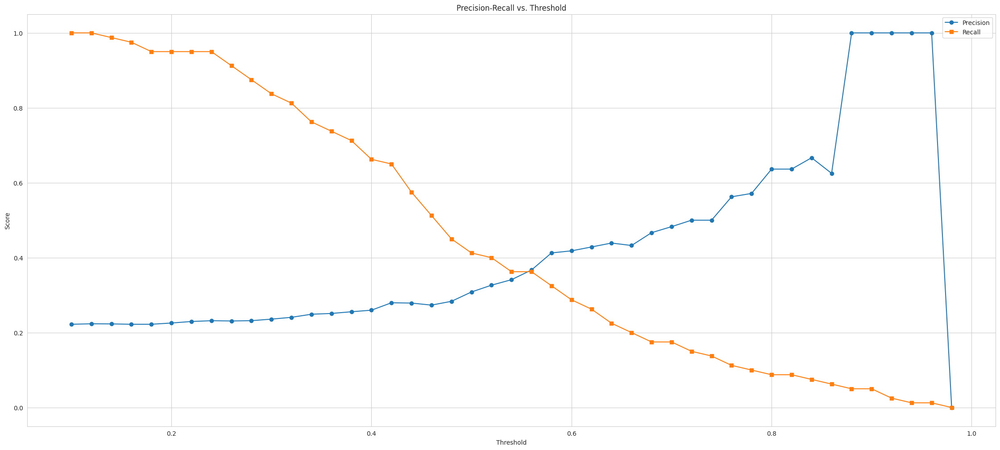

In [ ]:
probabilities,results_pr = compute_best_threshold(Y_test,X_test,xgb_clf,0.02)
pr_plot(results_pr)

In [ ]:
threshold =0.38
new_y_pred_xgb = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_xgb)

              precision    recall  f1-score   support

           0       0.84      0.42      0.56       284
           1       0.26      0.71      0.38        80

    accuracy                           0.48       364
   macro avg       0.55      0.56      0.47       364
weighted avg       0.71      0.48      0.52       364

[[118 166]
 [ 23  57]]



# **Score the Model on the testdata for which we dont have the groundtruth**

In [ ]:
scoredata = test_df.drop(columns =['TransactionsCred_CA', 'VolumeDeb_CA','TransactionsDeb_CA','VolumeCred_CA'],axis =1)
for column in scoredata.columns:
  if scoredata[column].dtype == 'object':
    scoredata = pd.get_dummies(scoredata, columns=[column], prefix=[column])
for column in scoredata.columns:
  scoredata['Sex_F'] = scoredata['Sex_F'].replace({False: 0, True: 1})
  scoredata['Sex_M'] = scoredata['Sex_M'].replace({False: 0, True: 1})
scoredata.fillna(0, inplace=True)
testdata_cc = scoredata.drop(['Count_CC','ActBal_CC','VolumeDebCash_Card','VolumeDebCashless_Card','TransactionsDebCash_Card','TransactionsDebCashless_Card'],axis=1)

<ipython-input-117-303b0becadbc>:6: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  scoredata['Sex_F'] = scoredata['Sex_F'].replace({False: 0, True: 1})
<ipython-input-117-303b0becadbc>:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  scoredata['Sex_M'] = scoredata['Sex_M'].replace({False: 0, True: 1})


In [ ]:
probabilities = xgb_clf.predict_proba(testdata_cc.drop("Client",axis=1))[:, 1]
new_y_pred_xgb = pred_bestthreshold(probabilities,threshold)
testdata_cc['Predicted_CC_prob'] = probabilities
testdata_cc['Predicted_Sale_CC'] = new_y_pred_xgb

In [ ]:
testdata_cc

,Client,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CL,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CL,VolumeCred,TransactionsCred,VolumeDeb,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Predicted_CC_prob,Predicted_Sale_CC
0,909,21,27,1,0.0,0.0,1.0,1.0,4.710714,0.0,0.000000,0.000000,4291.996429,789.129643,4.0,450.678571,166.571429,8.0,4.0,0,1,0.610377,1
1,699,37,175,1,0.0,4.0,1.0,0.0,1823.057143,0.0,18491.444286,0.000000,0.000000,1033.496071,8.0,661.483214,216.892857,13.0,5.0,0,1,0.428634,1
2,528,19,70,1,0.0,0.0,1.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,435.682143,2.0,390.056429,190.821429,10.0,2.0,1,0,0.464479,1
3,1145,61,45,1,0.0,0.0,0.0,0.0,324.710000,0.0,0.000000,0.000000,0.000000,132.158929,3.0,3.392857,0.000000,1.0,0.0,0,1,0.361852,0
4,517,41,28,1,0.0,0.0,0.0,0.0,17.051071,0.0,0.000000,0.000000,0.000000,570.157857,2.0,557.896429,251.178571,17.0,3.0,1,0,0.535833,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,419,33,82,1,0.0,0.0,1.0,0.0,352.782143,0.0,0.000000,0.000000,0.000000,1406.490714,7.0,1404.483571,0.000000,9.0,0.0,1,0,0.396473,1
642,1024,65,13,1,0.0,0.0,0.0,0.0,193.040000,0.0,0.000000,0.000000,0.000000,178.579643,2.0,109.107143,0.000000,3.0,0.0,0,1,0.433799,1
643,464,68,153,2,0.0,0.0,1.0,0.0,2249.049643,0.0,0.000000,237.297143,0.000000,811.332857,3.0,577.385714,347.857143,12.0,6.0,0,1,0.353623,0
644,409,31,91,1,0.0,0.0,1.0,0.0,348.402857,0.0,0.000000,0.000000,0.000000,469.179643,3.0,465.092857,271.714286,12.0,9.0,0,1,0.366152,0


In [ ]:
testdata_cc["Predicted_Sale_CC"].value_counts()

,count
Predicted_Sale_CC,
1,361
0,245


In [ ]:
testate_cc_sorted = testdata_cc.sort_values('Predicted_CC_prob', ascending=False)
testate_cc_sorted


,Client,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CL,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CL,VolumeCred,TransactionsCred,VolumeDeb,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Predicted_CC_prob,Predicted_Sale_CC
52,19,46,94,1,1.0,0.0,0.0,0.0,26118.098571,71661.592857,0.000000,0.000,0.000000,812.490000,3.0,148.446786,144.125357,5.0,4.0,1,0,0.959145,1
560,1487,52,68,1,1.0,0.0,0.0,0.0,8193.206071,58108.258571,0.000000,0.000,0.000000,1115.878214,3.0,643.892857,391.500000,9.0,6.0,0,1,0.937113,1
301,587,53,83,1,1.0,1.0,0.0,0.0,0.000000,96668.113929,381.131071,0.000,0.000000,1434.443571,4.0,607.821429,607.821429,5.0,5.0,1,0,0.920445,1
399,978,35,44,1,1.0,3.0,0.0,0.0,139.838929,37869.085357,0.000000,0.000,0.000000,3.270714,3.0,5714.285714,0.000000,2.0,0.0,0,1,0.913112,1
512,340,76,80,1,1.0,0.0,0.0,0.0,2380.045714,50040.891786,0.000000,0.000,0.000000,4428.672500,3.0,52.642857,0.000000,3.0,0.0,1,0,0.911420,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
393,1008,37,103,1,2.0,4.0,0.0,0.0,201.571786,5440.297143,0.000000,0.000,0.000000,9711.161429,12.0,2372.888214,2369.102500,11.0,9.0,1,0,0.087215,0
454,1373,25,26,1,0.0,0.0,0.0,0.0,1162.360357,0.000000,0.000000,0.000,0.000000,33409.293571,36.0,44078.183929,3908.843214,44.0,21.0,1,0,0.084835,0
603,871,45,157,1,0.0,0.0,0.0,2.0,2853.208214,0.000000,0.000000,0.000,8660.066071,5649.168571,7.0,5755.821071,4334.239643,21.0,8.0,1,0,0.081994,0
281,566,40,161,2,1.0,0.0,0.0,3.0,577.858214,22018.586429,0.000000,0.000,2405.282857,16306.741071,18.0,14705.971071,5434.428571,47.0,16.0,0,1,0.072995,0


In [ ]:
estimated_revenue = 2.88  # The average revenue per customer is 2 euro (as per data shared)

# Assign this estimated revenue to the test customers
testate_cc_sorted["estimated_revenue"] = estimated_revenue

# Adjust for the probability of the customer actually buying
testate_cc_sorted["expected_revenue"] = testate_cc_sorted["Predicted_CC_prob"] * testate_cc_sorted["estimated_revenue"]

# Select top 15% of customers
top_15_percent = testate_cc_sorted.head(int(0.15 * len(testate_cc_sorted)))

# Calculate total expected revenue from top 15% customers
expected_revenue = top_15_percent["expected_revenue"].sum()
print(f"Adjusted Expected Revenue from Top 15% Customers: ${expected_revenue:,.2f}")

Adjusted Expected Revenue from Top 15% Customers: $188.29


In [ ]:
top_15_percent.to_csv("/content/top_15_percent_cc.csv")

(606, 20)


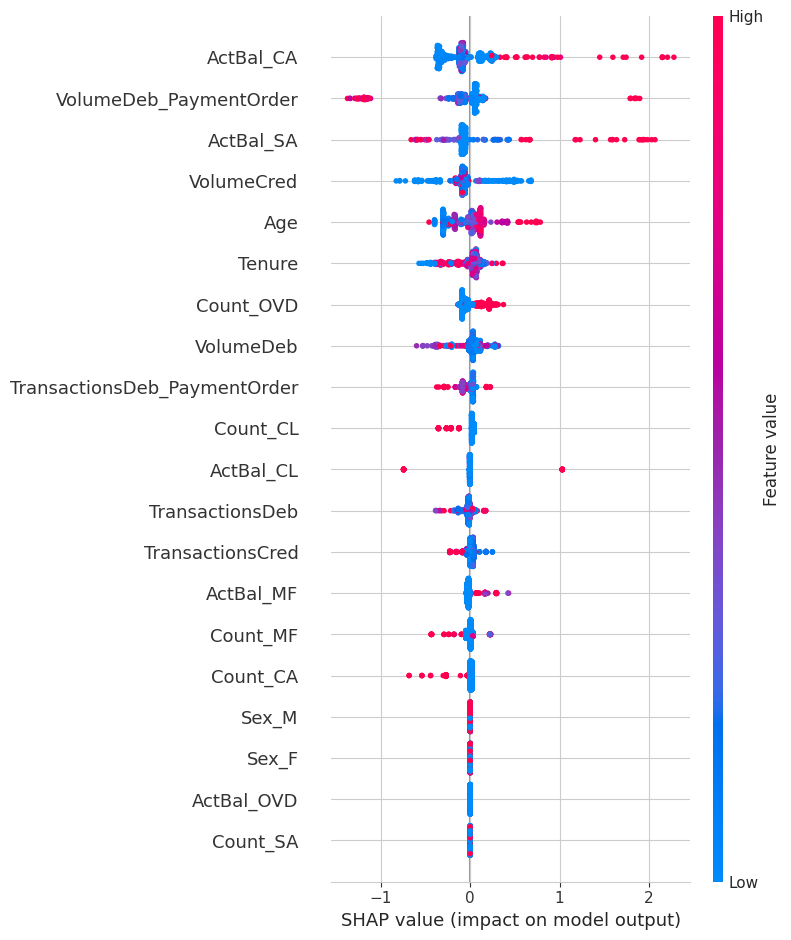

In [ ]:
shapplot(xgb_clf,testdata_cc.drop(["Predicted_Sale_CC","Predicted_CC_prob","Client"],axis=1),1,"xgb")

# **Model 2 - Consumer Loan**

In [ ]:
train_data_cl.shape,train_data_cl.columns

((909, 28),
 Index(['Client', 'Sale_CL', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
        'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
        'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
        'VolumeCred', 'TransactionsCred', 'VolumeDeb', 'VolumeDebCash_Card',
        'VolumeDebCashless_Card', 'VolumeDeb_PaymentOrder', 'TransactionsDeb',
        'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
        'TransactionsDeb_PaymentOrder', 'Sex_F', 'Sex_M'],
       dtype='object'))

In [ ]:
columns = ['Count_CL','ActBal_CL']
target = ['Sale_CL']
X,y,feature_names = modeldata(train_data_cl,columns, target)

test_size = 0.4
X_train, X_test, Y_train, Y_test = traintestsplit(X,y,test_size)
X_train_noclient = X_train.drop('Client', axis=1)
X_test_noclient = X_test.drop('Client', axis=1)
X_train_scaled,X_test_scaled = scale(X_train_noclient,X_test_noclient)

(545, 25) (364, 25)


              precision    recall  f1-score   support

           0       0.80      0.61      0.69       267
           1       0.35      0.59      0.44        97

    accuracy                           0.60       364
   macro avg       0.58      0.60      0.57       364
weighted avg       0.68      0.60      0.62       364

[[162 105]
 [ 40  57]]

[[-0.23834044  0.40530479  0.14523606  0.16973956 -0.01595325 -0.0736797
   0.12109272 -0.1329197  -0.13280648  0.16619091  0.13548437 -0.43553963
  -1.13633459  0.36379743  0.89166258  0.1080381  -0.05128685  0.09062929
  -0.26918168  0.3457374  -0.0583426   0.01891056 -0.36205699 -0.35572731]]
Feature Importance (absolute coefficients):

Class 1:
ActBal_CC: 1.1363345934387055
TransactionsCred: 0.8916625800989868
ActBal_OVD: 0.4355396329127521
Age: 0.40530478666649356
VolumeCred: 0.3637974322259504
TransactionsDeb_PaymentOrder: 0.36205698613632564
Sex_F: 0.35572730856895374
TransactionsDeb: 0.34573740219697474
VolumeDeb_PaymentOrder: 0.2691

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


    Threshold  Precision    Recall
0        0.10   0.267409  0.989691
1        0.12   0.268156  0.989691
2        0.14   0.270423  0.989691
3        0.16   0.271186  0.989691
4        0.18   0.272727  0.989691
5        0.20   0.270655  0.979381
6        0.22   0.276968  0.979381
7        0.24   0.277286  0.969072
8        0.26   0.283537  0.958763
9        0.28   0.286164  0.938144
10       0.30   0.285714  0.907216
11       0.32   0.292096  0.876289
12       0.34   0.294964  0.845361
13       0.36   0.304511  0.835052
14       0.38   0.304348  0.793814
15       0.40   0.309917  0.773196
16       0.42   0.308370  0.721649
17       0.44   0.324074  0.721649
18       0.46   0.329897  0.659794
19       0.48   0.350575  0.628866
20       0.50   0.351852  0.587629
21       0.52   0.369128  0.567010
22       0.54   0.387097  0.494845
23       0.56   0.401869  0.443299
24       0.58   0.419355  0.402062
25       0.60   0.456790  0.381443
26       0.62   0.492754  0.350515
27       0.64   0.52

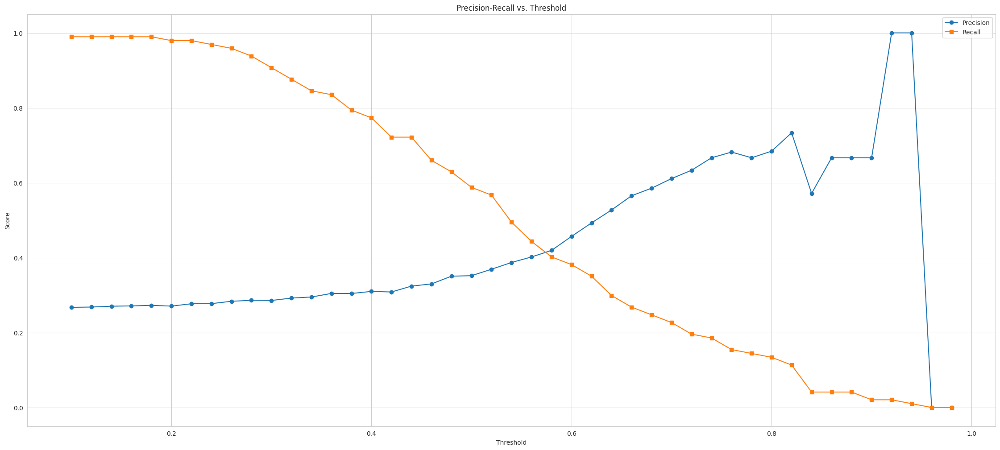

              precision    recall  f1-score   support

           0       0.79      0.80      0.79       267
           1       0.42      0.40      0.41        97

    accuracy                           0.69       364
   macro avg       0.60      0.60      0.60       364
weighted avg       0.69      0.69      0.69       364

[[213  54]
 [ 58  39]]



In [ ]:
clf_lr, y_pred_lr = logistic_reg_train(X_train_scaled,Y_train,X_test_scaled,Y_test)
metrics(Y_test,y_pred_lr)
extractlr_coefficients(clf_lr,X_test)

probabilities,results_pr = compute_best_threshold(Y_test,X_test_scaled,clf_lr,0.02)
pr_plot(results_pr)
threshold =0.58
new_y_pred_lr = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_lr)

Best Hyperparameters for Random Forest: {'class_weight': 'balanced', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 40}
Best Cross-Validation Precision for Random Forest: 0.6294457735247209
Best Hyperparameters for Random Forest: {'class_weight': 'balanced', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 40}
              precision    recall  f1-score   support

           0       0.76      0.75      0.76       267
           1       0.33      0.34      0.34        97

    accuracy                           0.64       364
   macro avg       0.55      0.55      0.55       364
weighted avg       0.65      0.64      0.64       364

[[201  66]
 [ 64  33]]



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

    Threshold  Precision    Recall
0        0.10   0.266484  1.000000
1        0.12   0.266484  1.000000
2        0.14   0.266484  1.000000
3        0.16   0.266484  1.000000
4        0.18   0.266484  1.000000
5        0.20   0.266484  1.000000
6        0.22   0.266484  1.000000
7        0.24   0.266484  1.000000
8        0.26   0.266484  1.000000
9        0.28   0.266484  1.000000
10       0.30   0.266484  1.000000
11       0.32   0.266484  1.000000
12       0.34   0.266484  1.000000
13       0.36   0.266484  1.000000
14       0.38   0.266854  0.979381
15       0.40   0.270588  0.948454
16       0.42   0.275641  0.886598
17       0.44   0.287273  0.814433
18       0.46   0.304348  0.649485
19       0.48   0.356164  0.536082
20       0.50   0.333333  0.340206
21       0.52   0.328358  0.226804
22       0.54   0.348837  0.154639
23       0.56   0.444444  0.123711
24       0.58   0.529412  0.092784
25       0.60   0.666667  0.082474
26       0.62   0.800000  0.041237
27       0.64   0.75

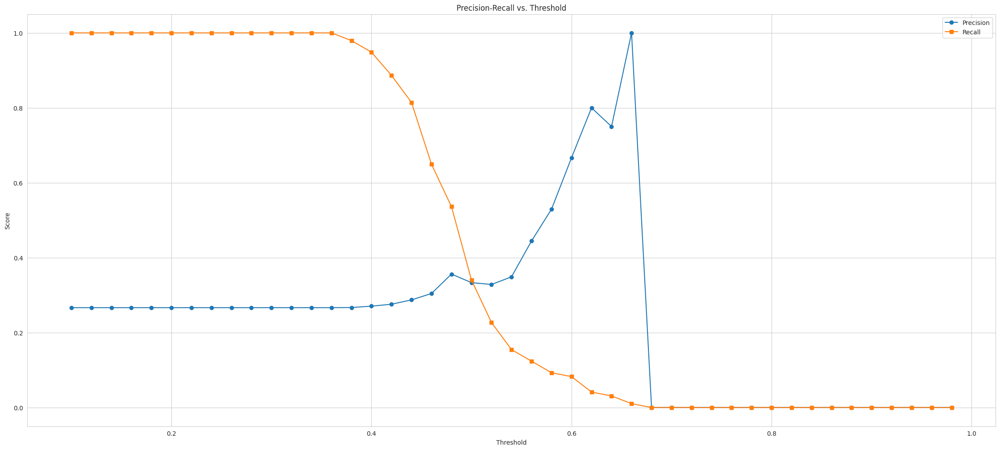

In [ ]:
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()
X_train = X_train.drop('Client', axis=1)
X_test = X_test.drop('Client', axis=1)
# Define the hyperparameters grid
param_grid = {
    'n_estimators': [5,10,40,60,80],  # Number of trees
    'max_depth': [3,5,7,8,10],       # Depth of the trees
    'min_samples_split': [2, 5, 10],   # Min samples to split node
    'min_samples_leaf': [1, 2, 4],     # Min samples at leaf node
    'class_weight': ['balanced'] # Handle class imbalance
}
clf_rf,y_pred_rf = randomforest_train(X_train,Y_train,X_test,Y_test,param_grid,"roc_auc")
metrics(Y_test,y_pred_rf)

probabilities,results_pr = compute_best_threshold(Y_test,X_test,clf_rf,0.02)
pr_plot(results_pr)


              precision    recall  f1-score   support

           0       0.76      0.75      0.76       267
           1       0.33      0.34      0.34        97

    accuracy                           0.64       364
   macro avg       0.55      0.55      0.55       364
weighted avg       0.65      0.64      0.64       364

[[201  66]
 [ 64  33]]

                         Feature  Gini Importance
1                         Tenure         0.180194
0                            Age         0.085111
7                      ActBal_CA         0.077951
12                    VolumeCred         0.074640
15            VolumeDebCash_Card         0.067348
14                     VolumeDeb         0.057150
20  TransactionsDebCashless_Card         0.054447
17        VolumeDeb_PaymentOrder         0.051011
21  TransactionsDeb_PaymentOrder         0.049734
9                      ActBal_MF         0.038556
18               TransactionsDeb         0.036409
11                     ActBal_CC         0.036336

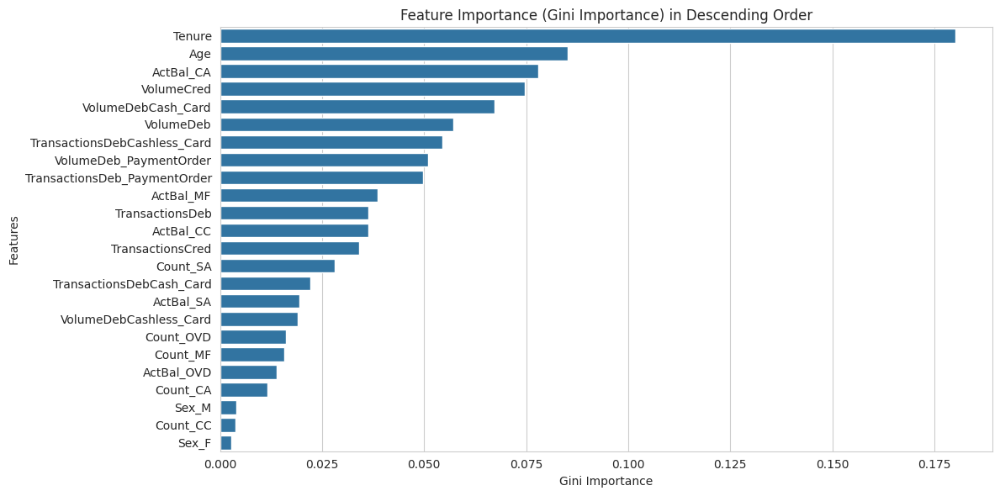

In [ ]:
threshold =0.5
new_y_pred_rf = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_rf)
auc_score = roc_auc_score(Y_test, probabilities)
auc_score
feature_imp_df=randomforest_feature_importance(clf_rf,X_test)
plotfeatureimp(feature_imp_df)

# **Feature Importance based on SHAP**

(545, 24, 2)


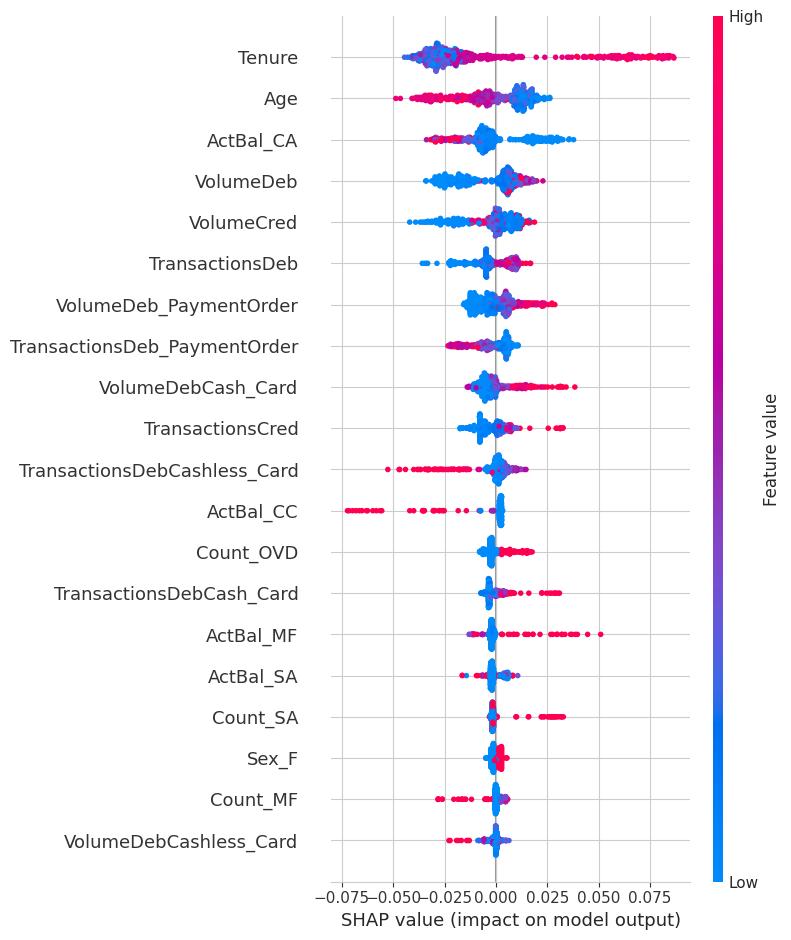

(364, 24, 2)


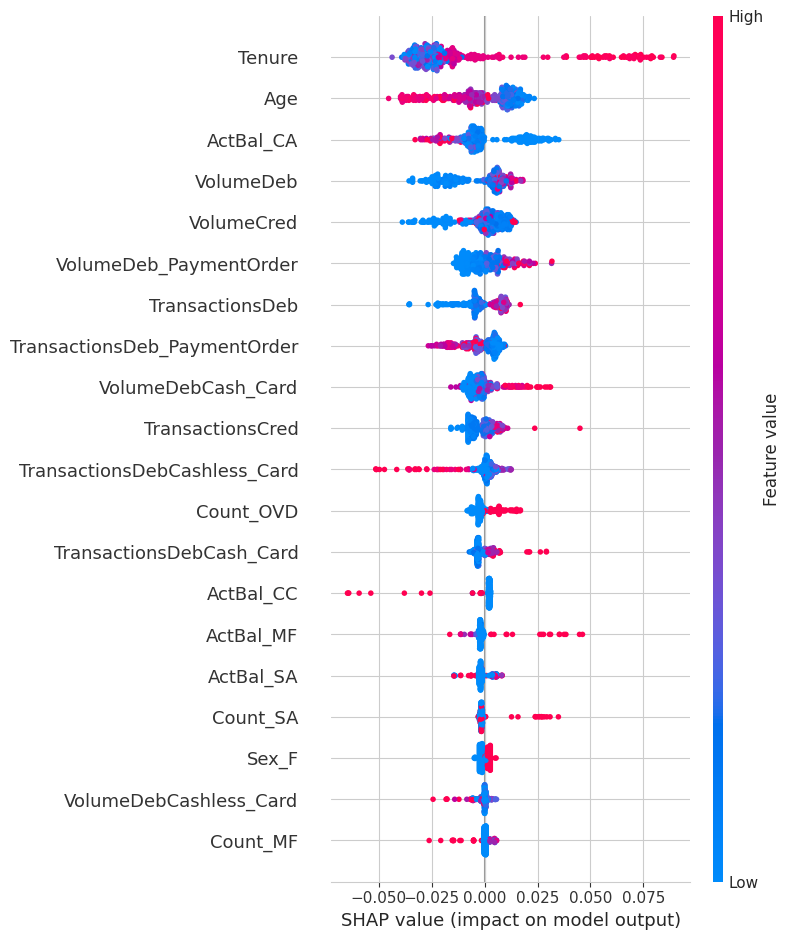

In [ ]:
shapplot(clf_rf,X_train,1,"rf")
shapplot(clf_rf,X_test,1,"rf")

#**XGBoost Classifier**

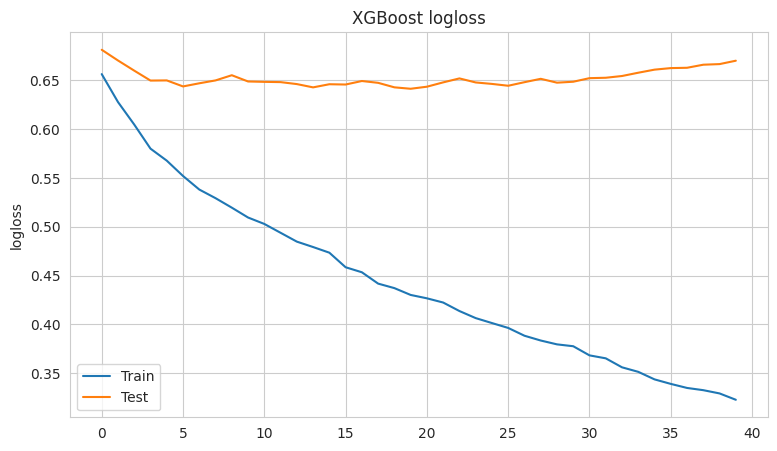

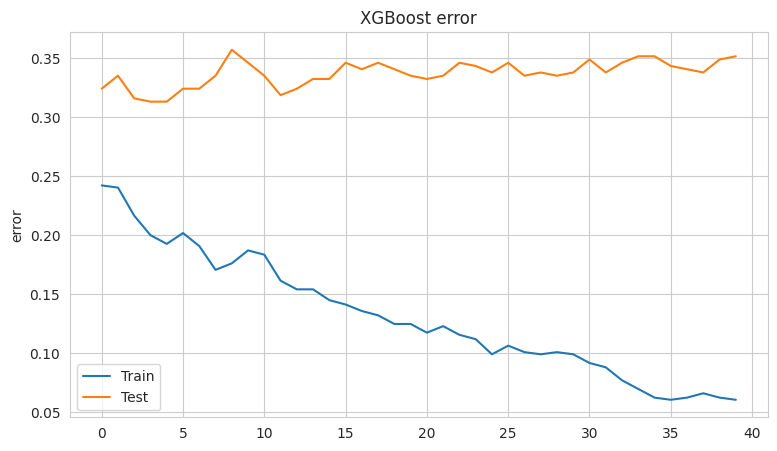

              precision    recall  f1-score   support

           0       0.78      0.75      0.77       267
           1       0.38      0.42      0.40        97

    accuracy                           0.66       364
   macro avg       0.58      0.59      0.58       364
weighted avg       0.68      0.66      0.67       364

[[201  66]
 [ 56  41]]



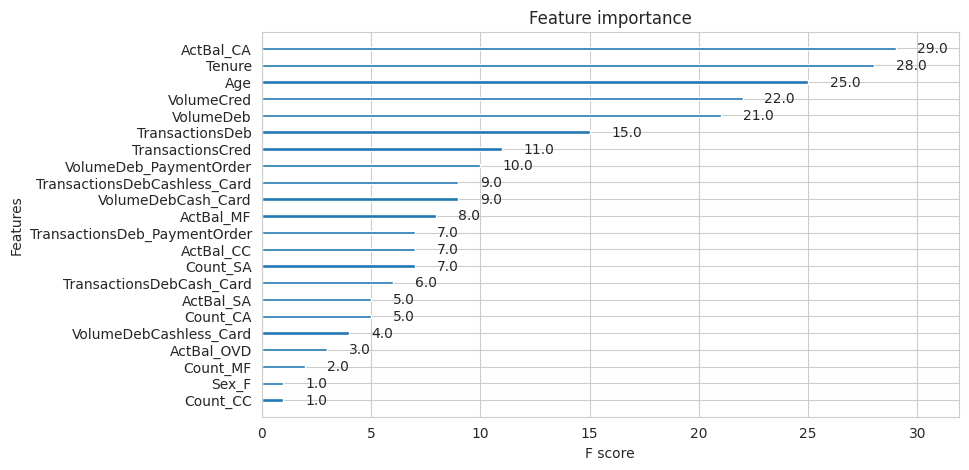

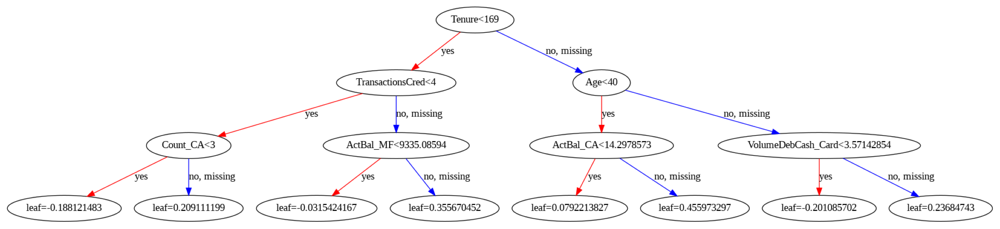

(545, 24)


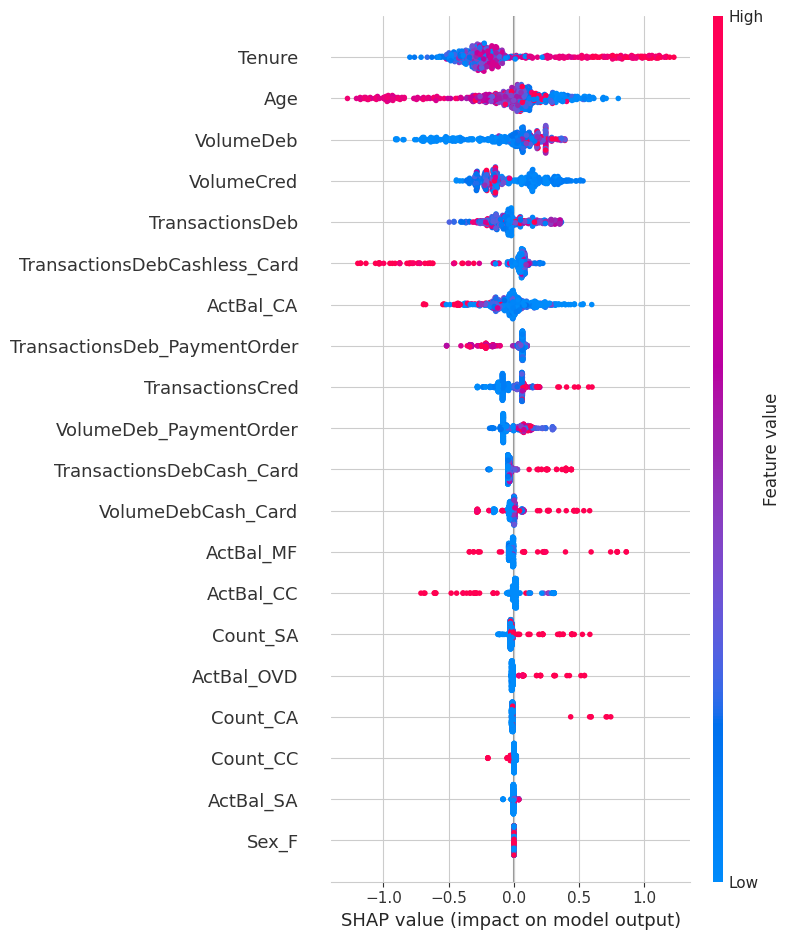

(364, 24)


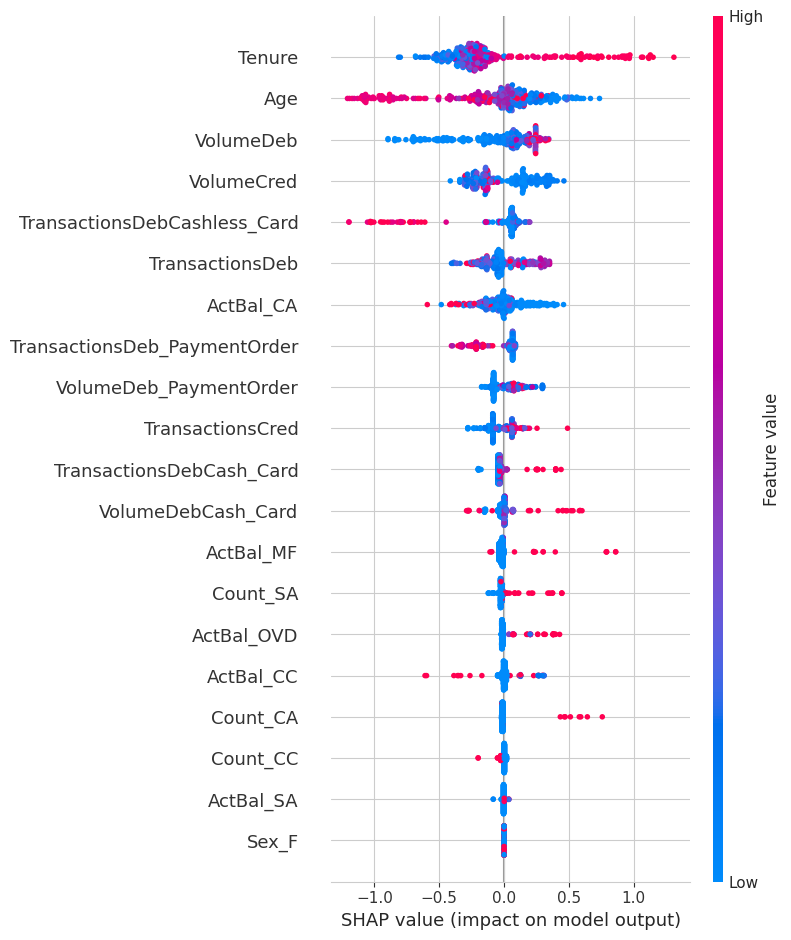

In [ ]:
classes_weights = computeweightxgboost(Y_train)
xgb_clf = xgbtrain(X_train,Y_train,X_test,Y_test,classes_weights)
y_pred_xgb = xgbvalidationresults(xgb_clf,X_test,Y_test)
metrics(Y_test,y_pred_xgb)
xgboostplot(xgb_clf)
shapplot(xgb_clf,X_train,1,"xgb")
shapplot(xgb_clf,X_test,1,"xgb")

In [ ]:
X_test_copy= X_test_copy.merge(data_sales_revenues[["Client","Revenue_CL"]], on='Client', how='left')

In [ ]:
X_test_copy.describe() # To get the mean of Revenue_CL

,Client,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CC,VolumeCred,TransactionsCred,VolumeDeb,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Revenue_CL
count,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000
mean,812.510989,45.222527,95.697802,1.085165,0.299451,0.739011,0.260989,0.104396,2169.378099,3585.404573,2688.130480,60.615062,22.292650,1822.732382,5.417582,1698.351726,289.509898,154.996260,793.284466,16.277473,1.972527,5.472527,4.873626,0.467033,0.532967,3.006548
std,466.689274,16.511869,64.161658,0.349576,0.556355,2.562823,0.439778,0.306194,4337.312372,13622.633660,16322.821604,232.351485,134.449513,6073.940663,5.937351,4276.846087,1281.282919,317.666303,2736.396988,16.700982,2.832187,8.920637,5.614372,0.499599,0.499599,6.177952
min,2.000000,18.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-8.283214,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,440.000000,32.000000,32.750000,1.000000,0.000000,0.000000,0.000000,0.000000,57.088929,0.000000,0.000000,0.000000,0.000000,266.970893,2.000000,239.033393,0.000000,0.000000,9.679464,4.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,800.500000,43.000000,88.000000,1.000000,0.000000,0.000000,0.000000,0.000000,591.675357,0.000000,0.000000,0.000000,0.000000,642.490000,3.500000,648.141786,89.285714,26.508929,200.857143,11.000000,1.000000,2.000000,3.000000,0.000000,1.000000,0.000000
75%,1233.000000,58.000000,151.000000,1.000000,1.000000,0.000000,1.000000,0.000000,2266.287857,0.000000,0.000000,0.000000,0.000000,1398.774643,6.000000,1454.710446,321.428571,186.592143,544.375000,22.000000,3.000000,7.000000,7.000000,1.000000,1.000000,2.388214
max,1608.000000,88.000000,252.000000,3.000000,3.000000,26.000000,1.000000,1.000000,33573.151786,173499.862857,202941.608929,1776.065357,1529.058929,98717.675000,63.000000,44782.186071,23571.428571,3635.701429,30069.696429,96.000000,25.000000,60.000000,34.000000,1.000000,1.000000,36.050714


In [ ]:
# Computing the profit associated with different thresholds

import numpy as np

# We have the validation labels (y_val_true) and predicted probabilities (y_val_probs)
# The average consumer loan revenue across the validation dataset is 3, so assuming the marketing cost per customer to be 2 euro

def compute_profit(threshold, y_true, y_probs, customer_revenue, marketing_cost=2):
    preds = (y_probs >= threshold).astype(int)  # Apply threshold
    TP = (preds == 1) & (y_true == 1)  # True Positives
    FP = (preds == 1) & (y_true == 0)  # False Positives
    # Total revenue from predicted buyers
    total_revenue = np.sum(customer_revenue[TP])

    # Total marketing cost (includes both TP and FP)
    total_cost = np.sum(marketing_cost * (TP | FP))

    return total_revenue - total_cost  # Net Revenue (Profit)

# Try different probability thresholds
thresholds = np.linspace(0.1, 0.9, 50)

y_val_true = Y_test.values.ravel()
y_val_probs = xgb_clf.predict_proba(X_test_copy.drop(["Client","Revenue_CL"],axis=1))[:, 1]
customer_revenue_val = X_test_copy["Revenue_CL"].values

profits = [compute_profit(t, y_val_true, y_val_probs, customer_revenue_val) for t in thresholds]
print(profits)
# Find the threshold that maximizes net revenue
best_threshold = thresholds[np.argmax(profits)]
print(f"Optimal Threshold for Maximum Revenue: {best_threshold:.2f}")


[np.float64(368.3835714285715), np.float64(370.3835714285715), np.float64(374.65535714285693), np.float64(378.65535714285693), np.float64(386.04821428571427), np.float64(380.09428571428566), np.float64(381.0314285714285), np.float64(358.9010714285713), np.float64(357.18678571428575), np.float64(343.97428571428577), np.float64(328.6725), np.float64(348.6725), np.float64(357.6725), np.float64(374.35428571428577), np.float64(396.5328571428572), np.float64(362.4092857142857), np.float64(353.5907142857144), np.float64(344.0982142857142), np.float64(300.6921428571429), np.float64(282.44499999999994), np.float64(281.23071428571427), np.float64(253.68999999999994), np.float64(262.7614285714285), np.float64(261.8421428571429), np.float64(241.91321428571433), np.float64(236.36178571428576), np.float64(199.08107142857148), np.float64(207.08107142857148), np.float64(201.01178571428574), np.float64(176.98464285714283), np.float64(146.59749999999997), np.float64(99.55071428571429), np.float64(105.55

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

    Threshold  Precision    Recall
0        0.10   0.267218  1.000000
1        0.12   0.268698  1.000000
2        0.14   0.266854  0.979381
3        0.16   0.266289  0.969072
4        0.18   0.268222  0.948454
5        0.20   0.267062  0.927835
6        0.22   0.264615  0.886598
7        0.24   0.270701  0.876289
8        0.26   0.270000  0.835052
9        0.28   0.276817  0.824742
10       0.30   0.278388  0.783505
11       0.32   0.297619  0.773196
12       0.34   0.309013  0.742268
13       0.36   0.306306  0.701031
14       0.38   0.313725  0.659794
15       0.40   0.307292  0.608247
16       0.42   0.306818  0.556701
17       0.44   0.320261  0.505155
18       0.46   0.358209  0.494845
19       0.48   0.376068  0.453608
20       0.50   0.383178  0.422680
21       0.52   0.393258  0.360825
22       0.54   0.407407  0.340206
23       0.56   0.414286  0.298969
24       0.58   0.416667  0.257732
25       0.60   0.392157  0.206186
26       0.62   0.434783  0.206186
27       0.64   0.46

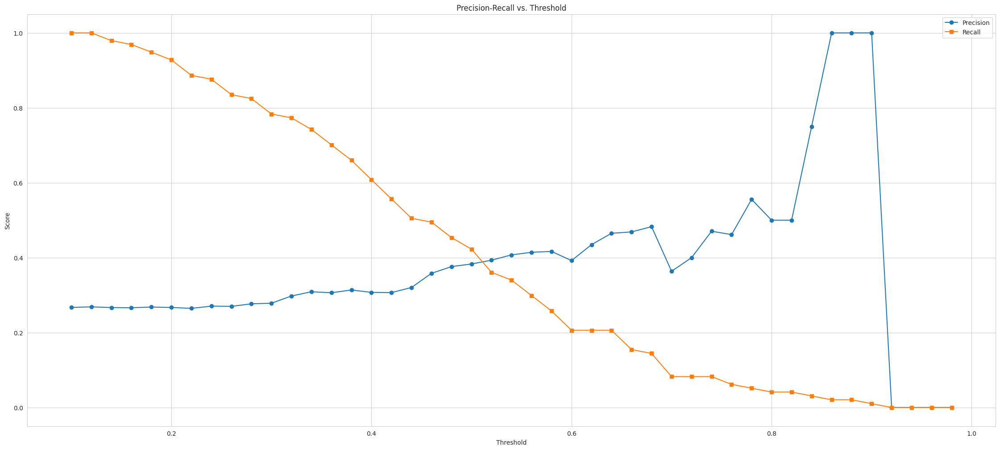

In [ ]:
probabilities,results_pr = compute_best_threshold(Y_test,X_test,xgb_clf,0.02)
pr_plot(results_pr)

In [ ]:
threshold =0.33
new_y_pred_xgb = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_xgb)

              precision    recall  f1-score   support

           0       0.81      0.37      0.51       267
           1       0.30      0.76      0.44        97

    accuracy                           0.47       364
   macro avg       0.56      0.56      0.47       364
weighted avg       0.68      0.47      0.49       364

[[ 98 169]
 [ 23  74]]



# Score data on the testdata without groundtruth

In [ ]:
testdata_cl = scoredata.drop(['Count_CL','ActBal_CL'],axis =1)

In [ ]:
probabilities = xgb_clf.predict_proba(testdata_cl.drop("Client",axis=1))[:, 1]
threshold =0.33
new_y_pred_xgb = pred_bestthreshold(probabilities,threshold)
testdata_cl['Predicted_CL_prob'] = probabilities
testdata_cl['Predicted_Sale_CL'] = new_y_pred_xgb

In [ ]:
testdata_cl

,Client,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CC,VolumeCred,TransactionsCred,VolumeDeb,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Predicted_CL_prob,Predicted_Sale_CL
0,909,21,27,1,0.0,0.0,1.0,0.0,4.710714,0.0,0.000000,0.000000,0.0,789.129643,4.0,450.678571,178.571429,0.000000,166.571429,8.0,1.0,0.0,4.0,0,1,0.364230,1
1,699,37,175,1,0.0,4.0,1.0,0.0,1823.057143,0.0,18491.444286,0.000000,0.0,1033.496071,8.0,661.483214,89.285714,0.000000,216.892857,13.0,2.0,0.0,5.0,0,1,0.564223,1
2,528,19,70,1,0.0,0.0,1.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,435.682143,2.0,390.056429,125.000000,70.842143,190.821429,10.0,4.0,3.0,2.0,1,0,0.566653,1
3,1145,61,45,1,0.0,0.0,0.0,0.0,324.710000,0.0,0.000000,0.000000,0.0,132.158929,3.0,3.392857,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0,1,0.324784,0
4,517,41,28,1,0.0,0.0,0.0,0.0,17.051071,0.0,0.000000,0.000000,0.0,570.157857,2.0,557.896429,71.428571,224.146429,251.178571,17.0,2.0,10.0,3.0,1,0,0.448324,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,419,33,82,1,0.0,0.0,1.0,0.0,352.782143,0.0,0.000000,0.000000,0.0,1406.490714,7.0,1404.483571,0.000000,0.000000,0.000000,9.0,0.0,0.0,0.0,1,0,0.360427,1
642,1024,65,13,1,0.0,0.0,0.0,0.0,193.040000,0.0,0.000000,0.000000,0.0,178.579643,2.0,109.107143,107.142857,0.000000,0.000000,3.0,2.0,0.0,0.0,0,1,0.311487,0
643,464,68,153,2,0.0,0.0,1.0,0.0,2249.049643,0.0,0.000000,237.297143,0.0,811.332857,3.0,577.385714,160.714286,65.421429,347.857143,12.0,2.0,3.0,6.0,0,1,0.421122,1
644,409,31,91,1,0.0,0.0,1.0,0.0,348.402857,0.0,0.000000,0.000000,0.0,469.179643,3.0,465.092857,178.571429,11.414286,271.714286,12.0,1.0,1.0,9.0,0,1,0.341495,1


In [ ]:
testdata_cl["Predicted_Sale_CL"].value_counts()

,count
Predicted_Sale_CL,
1,409
0,197


In [ ]:
testate_cl_sorted = testdata_cl.sort_values('Predicted_CL_prob', ascending=False)
testate_cl_sorted


,Client,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,ActBal_CA,ActBal_SA,ActBal_MF,ActBal_OVD,ActBal_CC,VolumeCred,TransactionsCred,VolumeDeb,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Predicted_CL_prob,Predicted_Sale_CL
394,41,20,198,1,0.0,0.0,1.0,0.0,194.955714,0.000000,0.0,1373.342857,0.000000,1638.628571,4.0,948.910714,310.714286,523.910714,107.142857,18.0,6.0,7.0,1.0,0,1,0.892367,1
83,852,30,199,1,0.0,0.0,0.0,0.0,357.145714,0.000000,0.0,0.000000,0.000000,694.461429,5.0,552.300000,0.000000,0.000000,550.607143,7.0,0.0,0.0,5.0,0,1,0.884435,1
465,231,27,216,2,0.0,0.0,1.0,0.0,113.781071,0.000000,0.0,0.000000,0.000000,899.314643,8.0,886.323571,392.857143,123.653571,284.178214,24.0,2.0,9.0,7.0,0,1,0.873284,1
503,886,36,181,1,1.0,0.0,0.0,0.0,168.904643,115074.533571,0.0,0.000000,0.000000,4881.583929,6.0,2691.632857,232.142857,107.668571,387.107143,25.0,3.0,9.0,11.0,1,0,0.866307,1
191,710,33,179,1,0.0,0.0,0.0,0.0,1026.117857,0.000000,0.0,0.000000,0.000000,492.607500,6.0,487.914286,432.142857,55.771429,0.000000,20.0,10.0,10.0,0.0,1,0,0.854328,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
619,567,59,29,1,0.0,0.0,0.0,0.0,6808.197857,0.000000,0.0,0.000000,0.000000,3734.596071,4.0,4495.000000,357.142857,0.000000,4134.928571,13.0,2.0,0.0,10.0,1,0,0.100302,0
223,64,61,38,1,0.0,0.0,1.0,0.0,0.759643,0.000000,0.0,0.000000,0.000000,1275.826786,5.0,1449.484643,535.714286,518.127857,393.035357,51.0,3.0,42.0,4.0,1,0,0.080318,0
16,1098,64,118,2,0.0,2.0,1.0,1.0,143.162857,0.000000,0.0,439.355000,2382.946071,10117.815714,19.0,8662.187857,767.857143,255.098571,4195.678571,47.0,2.0,12.0,24.0,0,1,0.078693,0
305,1416,61,132,1,0.0,0.0,1.0,1.0,840.716429,0.000000,0.0,301.750357,0.714286,788.953571,6.0,699.838214,85.714286,290.011071,193.428571,35.0,6.0,25.0,2.0,0,1,0.060561,0


In [ ]:
estimated_revenue = 3  # The average revenue per customer is 3 euro (as per data shared)

# Assign this estimated revenue to the test customers
testate_cl_sorted["estimated_revenue"] = estimated_revenue

# Adjust for the probability of the customer actually buying
testate_cl_sorted["expected_revenue"] = testate_cl_sorted["Predicted_CL_prob"] * testate_cl_sorted["estimated_revenue"]

# Select top 15% of customers
top_15_percent = testate_cl_sorted.head(int(0.15 * len(testate_cl_sorted)))

# Calculate total expected revenue from top 15% customers
expected_revenue = top_15_percent["expected_revenue"].sum()
print(f"Adjusted Expected Revenue from Top 15% Customers: ${expected_revenue:,.2f}")

Adjusted Expected Revenue from Top 15% Customers: $193.44


In [ ]:
top_15_percent.to_csv("/content/top_15_percent_cl.csv")

# **Model 3 - Mutual Fund**

In [ ]:
train_data_mf.shape,train_data_mf.columns

((909, 28),
 Index(['Client', 'Sale_MF', 'Age', 'Tenure', 'Count_CA', 'Count_SA',
        'Count_MF', 'Count_OVD', 'Count_CC', 'Count_CL', 'ActBal_CA',
        'ActBal_SA', 'ActBal_MF', 'ActBal_OVD', 'ActBal_CC', 'ActBal_CL',
        'VolumeCred', 'TransactionsCred', 'VolumeDeb', 'VolumeDebCash_Card',
        'VolumeDebCashless_Card', 'VolumeDeb_PaymentOrder', 'TransactionsDeb',
        'TransactionsDebCash_Card', 'TransactionsDebCashless_Card',
        'TransactionsDeb_PaymentOrder', 'Sex_F', 'Sex_M'],
       dtype='object'))

In [ ]:
columns = ['Count_MF','ActBal_MF']
target = ['Sale_MF']
X,y,feature_names = modeldata(train_data_mf,columns, target)

test_size = 0.4
X_train, X_test, Y_train, Y_test = traintestsplit(X,y,test_size)
X_train_noclient = X_train.drop('Client', axis=1)
X_test_noclient = X_test.drop('Client', axis=1)
X_train_scaled,X_test_scaled = scale(X_train_noclient,X_test_noclient)

(545, 25) (364, 25)


              precision    recall  f1-score   support

           0       0.85      0.63      0.73       286
           1       0.31      0.60      0.41        78

    accuracy                           0.63       364
   macro avg       0.58      0.62      0.57       364
weighted avg       0.74      0.63      0.66       364

[[181 105]
 [ 31  47]]

[[-0.0103687  -0.02347562 -0.05209391  0.06218432 -0.21551772 -0.19258429
  -0.01749536 -0.25030714 -0.13796534  0.00710386 -0.04873977 -0.41009218
   1.33147869  0.76286759 -1.95186675  0.00460786 -0.50735156  0.43055854
  -0.27991907 -0.16119672  0.66793333  0.09064271  0.21874215  0.45857668]]
Feature Importance (absolute coefficients):

Class 1:
TransactionsCred: 1.9518667481231204
ActBal_CL: 1.331478688256095
VolumeCred: 0.7628675896484458
TransactionsDebCash_Card: 0.6679333270393273
VolumeDebCash_Card: 0.5073515557320734
Sex_F: 0.45857667992481166
VolumeDebCashless_Card: 0.4305585438837931
ActBal_CC: 0.4100921783722564
VolumeDeb_Paymen

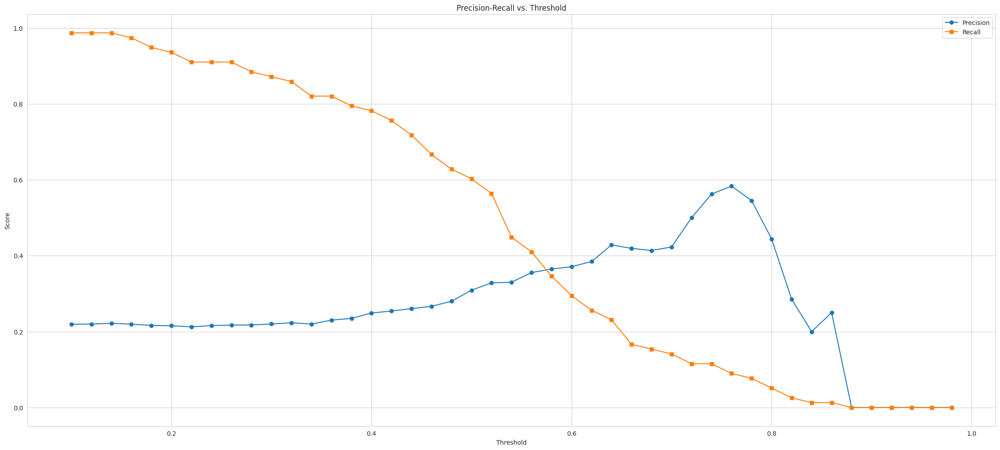

              precision    recall  f1-score   support

           0       0.83      0.80      0.81       286
           1       0.36      0.41      0.38        78

    accuracy                           0.71       364
   macro avg       0.59      0.60      0.60       364
weighted avg       0.73      0.71      0.72       364

[[228  58]
 [ 46  32]]



In [ ]:
clf_lr, y_pred_lr = logistic_reg_train(X_train_scaled,Y_train,X_test_scaled,Y_test)
metrics(Y_test,y_pred_lr)
extractlr_coefficients(clf_lr,X_test)

probabilities,results_pr = compute_best_threshold(Y_test,X_test_scaled,clf_lr,0.02)
pr_plot(results_pr)
threshold =0.56
new_y_pred_lr = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_lr)

Best Hyperparameters for Random Forest: {'class_weight': 'balanced', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 40}
Best Cross-Validation Precision for Random Forest: 0.621460430954813
Best Hyperparameters for Random Forest: {'class_weight': 'balanced', 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 40}
              precision    recall  f1-score   support

           0       0.79      0.96      0.86       286
           1       0.25      0.05      0.09        78

    accuracy                           0.76       364
   macro avg       0.52      0.50      0.47       364
weighted avg       0.67      0.76      0.70       364

[[274  12]
 [ 74   4]]



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

    Threshold  Precision    Recall
0        0.10   0.214085  0.974359
1        0.12   0.216374  0.948718
2        0.14   0.220544  0.935897
3        0.16   0.212025  0.858974
4        0.18   0.211073  0.782051
5        0.20   0.212996  0.756410
6        0.22   0.224806  0.743590
7        0.24   0.235294  0.717949
8        0.26   0.244344  0.692308
9        0.28   0.220513  0.551282
10       0.30   0.226415  0.461538
11       0.32   0.244444  0.423077
12       0.34   0.245763  0.371795
13       0.36   0.271845  0.358974
14       0.38   0.258427  0.294872
15       0.40   0.259740  0.256410
16       0.42   0.250000  0.179487
17       0.44   0.317073  0.166667
18       0.46   0.280000  0.089744
19       0.48   0.222222  0.051282
20       0.50   0.250000  0.051282
21       0.52   0.250000  0.038462
22       0.54   0.000000  0.000000
23       0.56   0.000000  0.000000
24       0.58   0.000000  0.000000
25       0.60   0.000000  0.000000
26       0.62   0.000000  0.000000
27       0.64   0.00

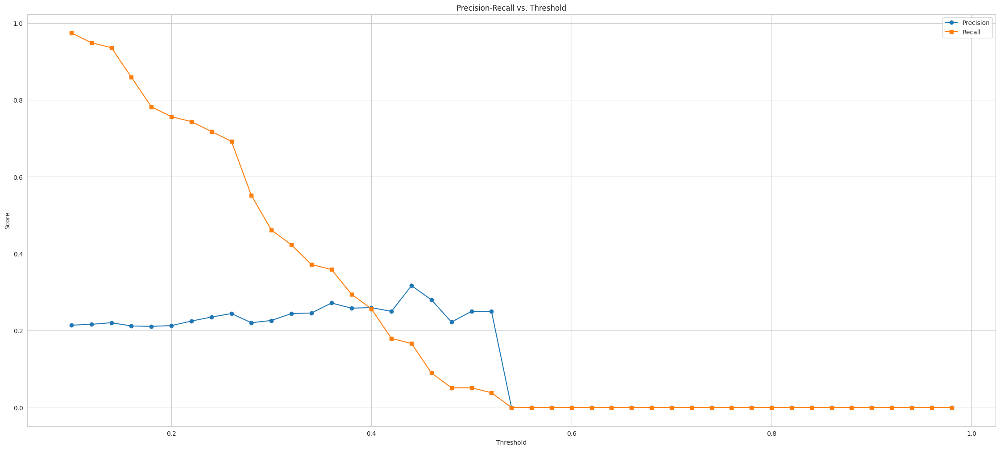

In [ ]:
X_train_copy = X_train.copy()
X_test_copy = X_test.copy()
X_train = X_train.drop('Client', axis=1)
X_test = X_test.drop('Client', axis=1)
# Define the hyperparameters grid
param_grid = {
    'n_estimators': [5,10,40,60,80],  # Number of trees
    'max_depth': [3,5,7,8,10],       # Depth of the trees
    'min_samples_split': [2, 5, 10],   # Min samples to split node
    'min_samples_leaf': [1, 2, 4],     # Min samples at leaf node
    'class_weight': ['balanced'] # Handle class imbalance
}
clf_rf,y_pred_rf = randomforest_train(X_train,Y_train,X_test,Y_test,param_grid,"roc_auc")
metrics(Y_test,y_pred_rf)

probabilities,results_pr = compute_best_threshold(Y_test,X_test,clf_rf,0.02)
pr_plot(results_pr)


              precision    recall  f1-score   support

           0       0.79      0.96      0.86       286
           1       0.25      0.05      0.09        78

    accuracy                           0.76       364
   macro avg       0.52      0.50      0.47       364
weighted avg       0.67      0.76      0.70       364

[[274  12]
 [ 74   4]]

                         Feature  Gini Importance
1                         Tenure         0.094608
7                      ActBal_CA         0.091991
12                    VolumeCred         0.090591
18               TransactionsDeb         0.079800
14                     VolumeDeb         0.076176
20  TransactionsDebCashless_Card         0.068637
0                            Age         0.066713
15            VolumeDebCash_Card         0.065246
13              TransactionsCred         0.058273
16        VolumeDebCashless_Card         0.053693
17        VolumeDeb_PaymentOrder         0.047726
21  TransactionsDeb_PaymentOrder         0.043878

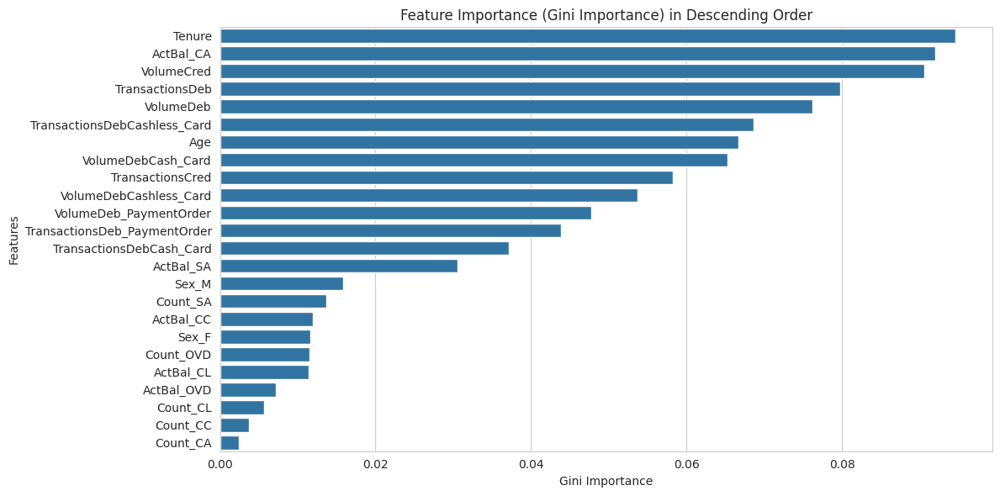

In [ ]:
threshold =0.5
new_y_pred_rf = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_rf)
auc_score = roc_auc_score(Y_test, probabilities)
auc_score
feature_imp_df=randomforest_feature_importance(clf_rf,X_test)
plotfeatureimp(feature_imp_df)

# **Feature Importance based on SHAP**

(545, 24, 2)


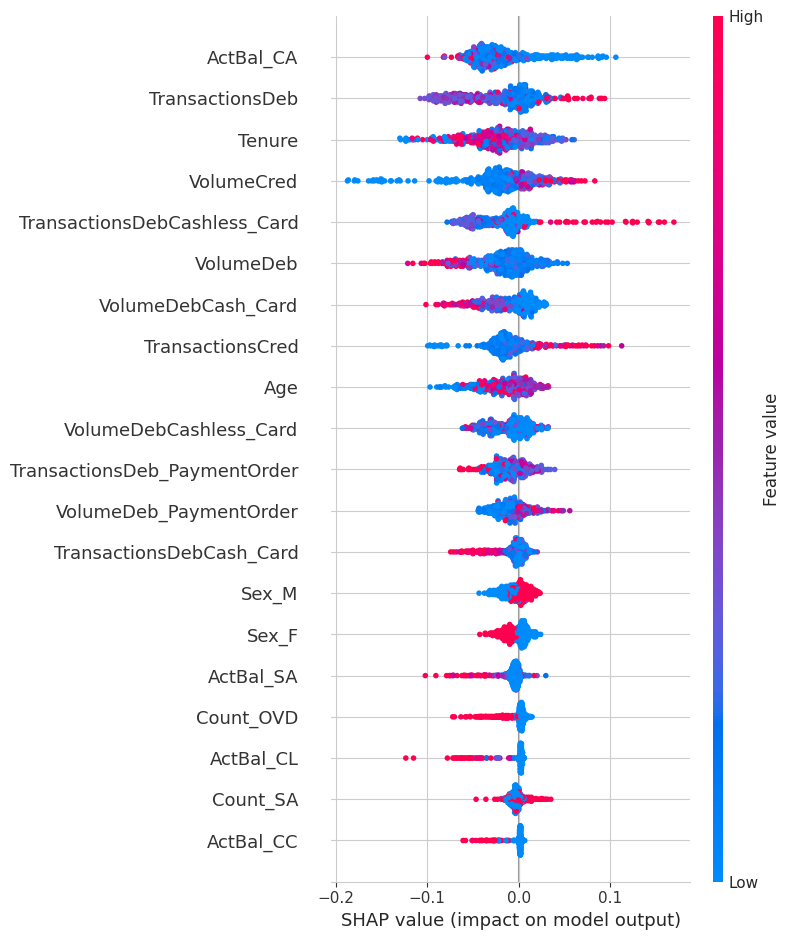

(364, 24, 2)


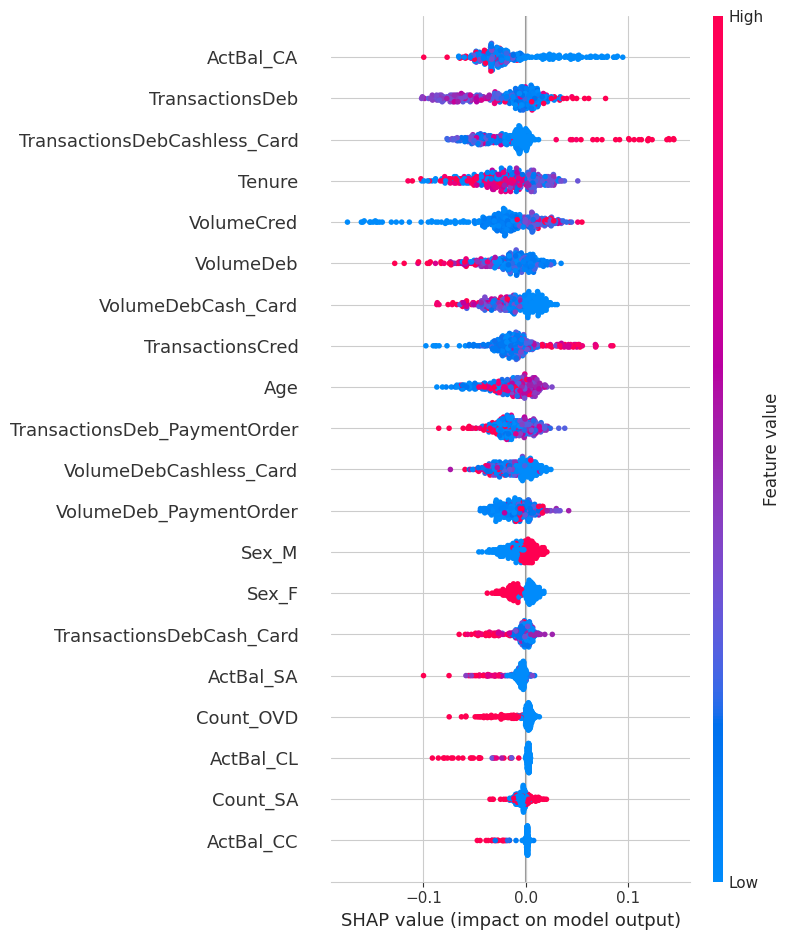

In [ ]:
shapplot(clf_rf,X_train,1,"rf")
shapplot(clf_rf,X_test,1,"rf")

#**XGBoost Classifier**

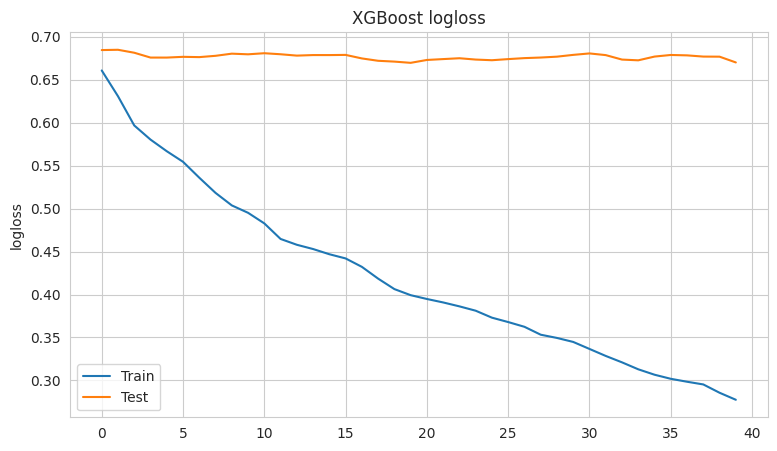

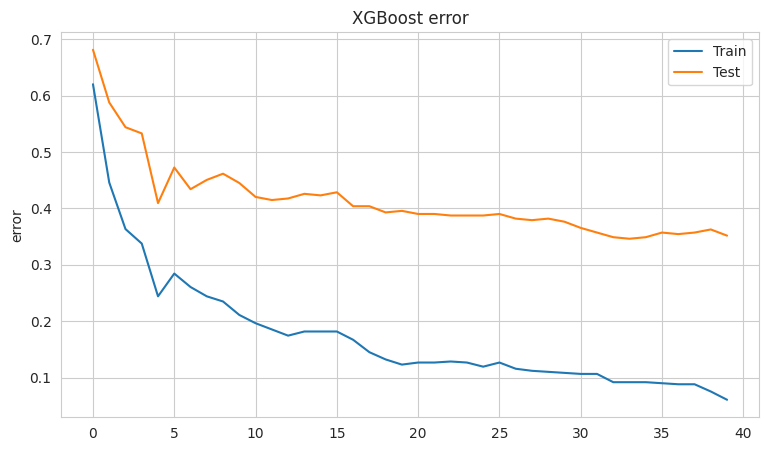

              precision    recall  f1-score   support

           0       0.79      0.67      0.73       286
           1       0.23      0.35      0.27        78

    accuracy                           0.60       364
   macro avg       0.51      0.51      0.50       364
weighted avg       0.67      0.60      0.63       364

[[193  93]
 [ 51  27]]



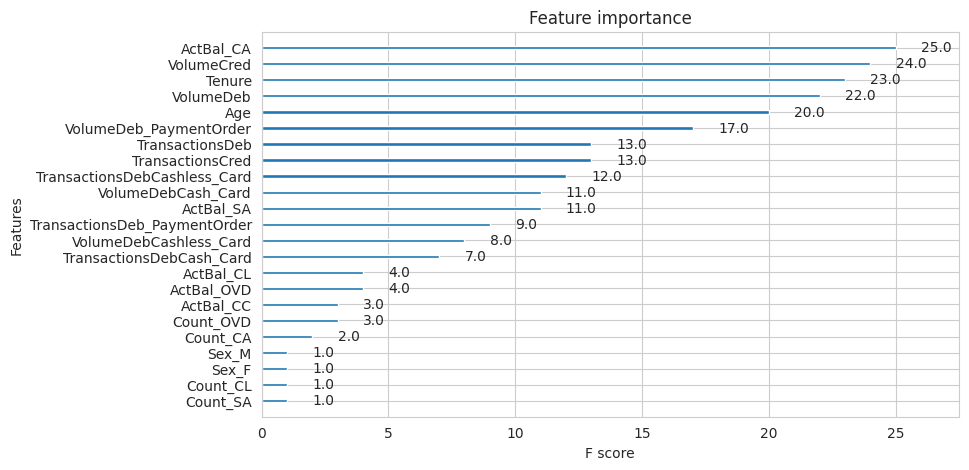

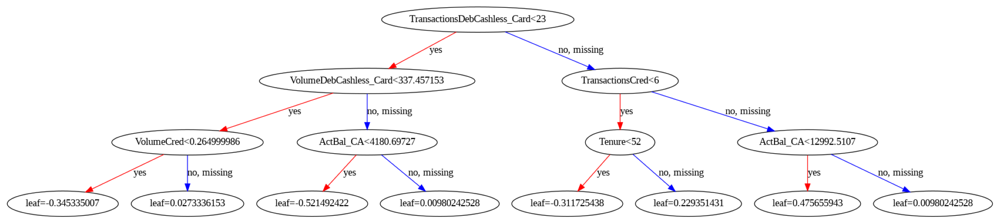

(545, 24)


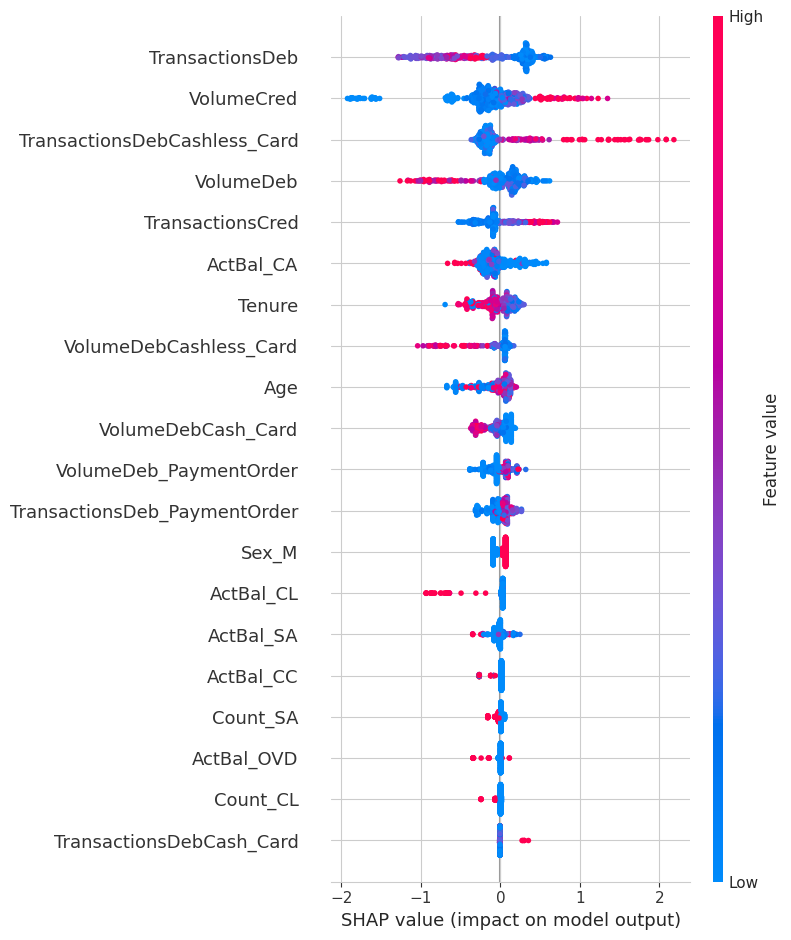

(364, 24)


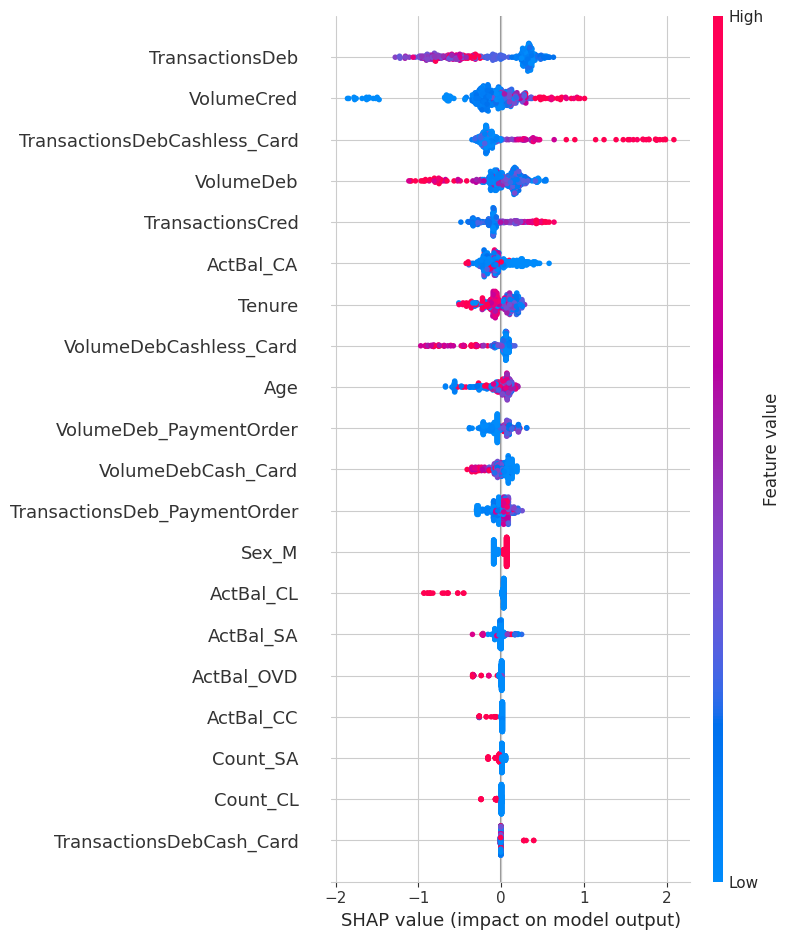

In [ ]:
classes_weights = computeweightxgboost(Y_train)
xgb_clf = xgbtrain(X_train,Y_train,X_test,Y_test,classes_weights)
y_pred_xgb = xgbvalidationresults(xgb_clf,X_test,Y_test)
metrics(Y_test,y_pred_xgb)
xgboostplot(xgb_clf)
shapplot(xgb_clf,X_train,1,"xgb")
shapplot(xgb_clf,X_test,1,"xgb")

In [ ]:
X_test_copy= X_test_copy.merge(data_sales_revenues[["Client","Revenue_MF"]], on='Client', how='left')

In [ ]:
X_test_copy.describe() # To get the mean of Revenue_MF

,Client,Age,Tenure,Count_CA,Count_SA,Count_OVD,Count_CC,Count_CL,ActBal_CA,ActBal_SA,ActBal_OVD,ActBal_CC,ActBal_CL,VolumeCred,TransactionsCred,VolumeDeb,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Revenue_MF
count,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000,364.000000
mean,812.510989,45.222527,95.697802,1.085165,0.299451,0.260989,0.104396,0.082418,2169.378099,3585.404573,60.615062,22.292650,308.157042,1822.732382,5.417582,1698.351726,289.509898,154.996260,793.284466,16.277473,1.972527,5.472527,4.873626,0.467033,0.532967,2.563951
std,466.689274,16.511869,64.161658,0.349576,0.556355,0.439778,0.306194,0.312845,4337.312372,13622.633660,232.351485,134.449513,1589.485412,6073.940663,5.937351,4276.846087,1281.282919,317.666303,2736.396988,16.700982,2.832187,8.920637,5.614372,0.499599,0.499599,14.234765
min,2.000000,18.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-8.283214,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,440.000000,32.000000,32.750000,1.000000,0.000000,0.000000,0.000000,0.000000,57.088929,0.000000,0.000000,0.000000,0.000000,266.970893,2.000000,239.033393,0.000000,0.000000,9.679464,4.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,800.500000,43.000000,88.000000,1.000000,0.000000,0.000000,0.000000,0.000000,591.675357,0.000000,0.000000,0.000000,0.000000,642.490000,3.500000,648.141786,89.285714,26.508929,200.857143,11.000000,1.000000,2.000000,3.000000,0.000000,1.000000,0.000000
75%,1233.000000,58.000000,151.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2266.287857,0.000000,0.000000,0.000000,0.000000,1398.774643,6.000000,1454.710446,321.428571,186.592143,544.375000,22.000000,3.000000,7.000000,7.000000,1.000000,1.000000,0.000000
max,1608.000000,88.000000,252.000000,3.000000,3.000000,1.000000,1.000000,2.000000,33573.151786,173499.862857,1776.065357,1529.058929,17062.324286,98717.675000,63.000000,44782.186071,23571.428571,3635.701429,30069.696429,96.000000,25.000000,60.000000,34.000000,1.000000,1.000000,220.488214


In [ ]:
# Computing the profit associated with different thresholds

import numpy as np

# We have validation labels (y_val_true) and predicted probabilities (y_val_probs)
# The average credit card revenue across the validation dataset is 2.56, so assuming the marketing cost per customer to be 2 euro

def compute_profit(threshold, y_true, y_probs, customer_revenue, marketing_cost=2):
    preds = (y_probs >= threshold).astype(int)  # Apply threshold
    TP = (preds == 1) & (y_true == 1)  # True Positives
    FP = (preds == 1) & (y_true == 0)  # False Positives
    # Total revenue from predicted buyers
    total_revenue = np.sum(customer_revenue[TP])

    # Total marketing cost (includes both TP and FP)
    total_cost = np.sum(marketing_cost * (TP | FP))

    return total_revenue - total_cost  # Net Revenue (Profit)

# Try different probability thresholds
thresholds = np.linspace(0.1, 0.9, 50)

y_val_true = Y_test.values.ravel()
y_val_probs = xgb_clf.predict_proba(X_test_copy.drop(["Client","Revenue_MF"],axis=1))[:, 1]
customer_revenue_val = X_test_copy["Revenue_MF"].values

profits = [compute_profit(t, y_val_true, y_val_probs, customer_revenue_val) for t in thresholds]
print(profits)
# Find the threshold that maximizes net revenue
best_threshold = thresholds[np.argmax(profits)]
print(f"Optimal Threshold for Maximum Revenue: {best_threshold:.2f}")

[np.float64(227.49964285714282), np.float64(234.0458928571428), np.float64(245.25874999999996), np.float64(224.08446428571426), np.float64(212.15125), np.float64(232.48767857142866), np.float64(238.6839285714285), np.float64(257.00732142857134), np.float64(223.61625000000004), np.float64(225.33160714285714), np.float64(185.87517857142848), np.float64(198.63214285714275), np.float64(218.63214285714275), np.float64(234.63214285714275), np.float64(248.63214285714275), np.float64(260.63214285714275), np.float64(245.90035714285716), np.float64(261.23910714285716), np.float64(278.26928571428573), np.float64(204.69107142857138), np.float64(214.79232142857143), np.float64(222.85089285714287), np.float64(248.94464285714287), np.float64(244.02714285714274), np.float64(264.87178571428575), np.float64(267.9421428571428), np.float64(281.16499999999996), np.float64(255.82732142857145), np.float64(279.82732142857145), np.float64(288.94892857142855), np.float64(244.80910714285716), np.float64(190.2894

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

    Threshold  Precision    Recall
0        0.10   0.217765  0.974359
1        0.12   0.218659  0.961538
2        0.14   0.210210  0.897436
3        0.16   0.201258  0.820513
4        0.18   0.209836  0.820513
5        0.20   0.200000  0.756410
6        0.22   0.206406  0.743590
7        0.24   0.201493  0.692308
8        0.26   0.203125  0.666667
9        0.28   0.200820  0.628205
10       0.30   0.210300  0.628205
11       0.32   0.219731  0.628205
12       0.34   0.226852  0.628205
13       0.36   0.223301  0.589744
14       0.38   0.222798  0.551282
15       0.40   0.215470  0.500000
16       0.42   0.222222  0.487179
17       0.44   0.220126  0.448718
18       0.46   0.230769  0.423077
19       0.48   0.229008  0.384615
20       0.50   0.225000  0.346154
21       0.52   0.238938  0.346154
22       0.54   0.223404  0.269231
23       0.56   0.240506  0.243590
24       0.58   0.242857  0.217949
25       0.60   0.241935  0.192308
26       0.62   0.269231  0.179487
27       0.64   0.30

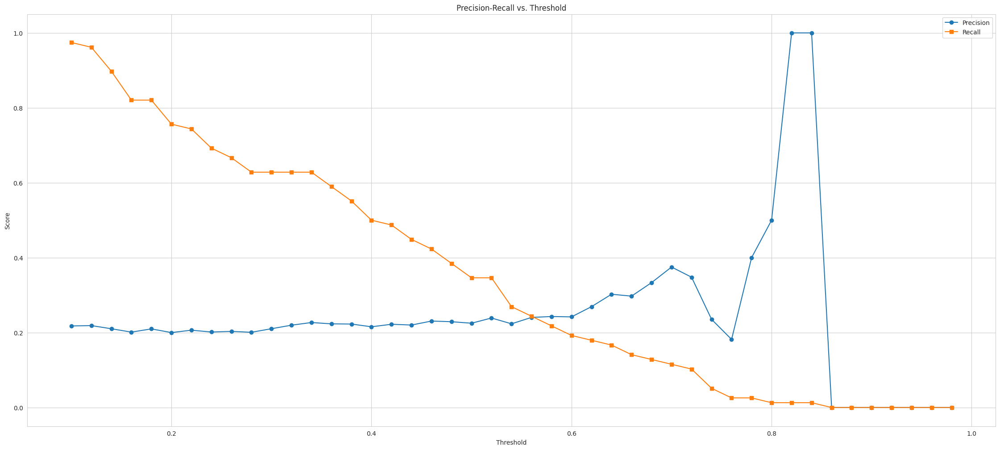

In [ ]:
probabilities,results_pr = compute_best_threshold(Y_test,X_test,xgb_clf,0.02)
pr_plot(results_pr)

In [ ]:
threshold =0.57
new_y_pred_xgb = pred_bestthreshold(probabilities,threshold)
metrics(Y_test,new_y_pred_xgb)

              precision    recall  f1-score   support

           0       0.79      0.81      0.80       286
           1       0.25      0.23      0.24        78

    accuracy                           0.68       364
   macro avg       0.52      0.52      0.52       364
weighted avg       0.68      0.68      0.68       364

[[231  55]
 [ 60  18]]



# Score data on the testdata without groundtruth

In [ ]:
testdata_mf = scoredata.drop(['Count_MF','ActBal_MF'],axis =1)

In [ ]:
probabilities = xgb_clf.predict_proba(testdata_mf.drop("Client",axis=1))[:, 1]
threshold =0.57
new_y_pred_xgb = pred_bestthreshold(probabilities,threshold)
testdata_mf['Predicted_MF_prob'] = probabilities
testdata_mf['Predicted_Sale_MF'] = new_y_pred_xgb

In [ ]:
testdata_mf

,Client,Age,Tenure,Count_CA,Count_SA,Count_OVD,Count_CC,Count_CL,ActBal_CA,ActBal_SA,ActBal_OVD,ActBal_CC,ActBal_CL,VolumeCred,TransactionsCred,VolumeDeb,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Predicted_MF_prob,Predicted_Sale_MF
0,909,21,27,1,0.0,1.0,0.0,1.0,4.710714,0.0,0.000000,0.0,4291.996429,789.129643,4.0,450.678571,178.571429,0.000000,166.571429,8.0,1.0,0.0,4.0,0,1,0.366996,0
1,699,37,175,1,0.0,1.0,0.0,0.0,1823.057143,0.0,0.000000,0.0,0.000000,1033.496071,8.0,661.483214,89.285714,0.000000,216.892857,13.0,2.0,0.0,5.0,0,1,0.635456,1
2,528,19,70,1,0.0,1.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,435.682143,2.0,390.056429,125.000000,70.842143,190.821429,10.0,4.0,3.0,2.0,1,0,0.310783,0
3,1145,61,45,1,0.0,0.0,0.0,0.0,324.710000,0.0,0.000000,0.0,0.000000,132.158929,3.0,3.392857,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0,1,0.599135,1
4,517,41,28,1,0.0,0.0,0.0,0.0,17.051071,0.0,0.000000,0.0,0.000000,570.157857,2.0,557.896429,71.428571,224.146429,251.178571,17.0,2.0,10.0,3.0,1,0,0.296536,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
641,419,33,82,1,0.0,1.0,0.0,0.0,352.782143,0.0,0.000000,0.0,0.000000,1406.490714,7.0,1404.483571,0.000000,0.000000,0.000000,9.0,0.0,0.0,0.0,1,0,0.651104,1
642,1024,65,13,1,0.0,0.0,0.0,0.0,193.040000,0.0,0.000000,0.0,0.000000,178.579643,2.0,109.107143,107.142857,0.000000,0.000000,3.0,2.0,0.0,0.0,0,1,0.451799,0
643,464,68,153,2,0.0,1.0,0.0,0.0,2249.049643,0.0,237.297143,0.0,0.000000,811.332857,3.0,577.385714,160.714286,65.421429,347.857143,12.0,2.0,3.0,6.0,0,1,0.434796,0
644,409,31,91,1,0.0,1.0,0.0,0.0,348.402857,0.0,0.000000,0.0,0.000000,469.179643,3.0,465.092857,178.571429,11.414286,271.714286,12.0,1.0,1.0,9.0,0,1,0.383444,0


In [ ]:
testdata_mf["Predicted_Sale_MF"].value_counts()

,count
Predicted_Sale_MF,
0,481
1,125


In [ ]:
testate_mf_sorted = testdata_mf.sort_values('Predicted_MF_prob', ascending=False)
testate_mf_sorted


,Client,Age,Tenure,Count_CA,Count_SA,Count_OVD,Count_CC,Count_CL,ActBal_CA,ActBal_SA,ActBal_OVD,ActBal_CC,ActBal_CL,VolumeCred,TransactionsCred,VolumeDeb,VolumeDebCash_Card,VolumeDebCashless_Card,VolumeDeb_PaymentOrder,TransactionsDeb,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sex_F,Sex_M,Predicted_MF_prob,Predicted_Sale_MF
149,200,24,129,2,0.0,0.0,1.0,0.0,0.000000,0.000000,0.0,476.714286,0.000000,20182.245714,10.0,7658.063214,667.857143,2470.335714,892.351429,62.0,4.0,39.0,10.0,1,0,0.866604,1
593,1553,35,87,1,0.0,0.0,0.0,0.0,108.764286,0.000000,0.0,0.000000,0.000000,1569.365357,6.0,2483.683571,599.982143,1091.174286,747.455714,58.0,8.0,27.0,16.0,1,0,0.856223,1
402,353,61,150,1,1.0,0.0,0.0,0.0,985.760000,1437.146786,0.0,0.000000,0.000000,3823.311786,16.0,2852.743929,200.000000,712.817500,1553.535714,71.0,6.0,33.0,26.0,0,1,0.836579,1
287,766,32,95,1,0.0,0.0,0.0,0.0,497.918929,0.000000,0.0,0.000000,0.000000,25314.012857,5.0,398.392857,0.000000,0.000000,396.000000,6.0,0.0,0.0,5.0,0,1,0.836273,1
527,1225,45,220,1,0.0,0.0,0.0,0.0,3749.135000,0.000000,0.0,0.000000,0.000000,1267.996786,7.0,1410.729643,314.285714,550.944286,513.356786,48.0,10.0,24.0,4.0,0,1,0.826896,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
635,431,21,208,1,0.0,0.0,0.0,0.0,38.551071,0.000000,0.0,0.000000,0.000000,0.000357,1.0,1.964286,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0,1,0.060154,0
600,936,22,13,1,0.0,0.0,0.0,0.0,1973.280714,0.000000,0.0,0.000000,0.000000,0.000714,1.0,3.392857,0.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0,1,0.056166,0
582,1443,40,152,1,0.0,1.0,0.0,1.0,2159.653929,0.000000,0.0,0.000000,9107.142857,760.076786,3.0,1922.342857,1042.857143,626.771429,13.607143,45.0,16.0,11.0,1.0,1,0,0.054776,0
526,164,40,151,1,1.0,0.0,0.0,0.0,2690.460357,2579.983214,0.0,0.000000,0.000000,15.630357,2.0,3623.965000,107.142857,595.072143,2920.500000,15.0,1.0,8.0,5.0,1,0,0.041791,0


In [ ]:
estimated_revenue =  2.56 #The average revenue per customer is 2.56 euro (as per validation data which is shared)

# Assign this estimated revenue to the test customers
testate_mf_sorted["estimated_revenue"] = estimated_revenue

# Adjust for the probability of the customer actually buying
testate_mf_sorted["expected_revenue"] = testate_mf_sorted["Predicted_MF_prob"] * testate_mf_sorted["estimated_revenue"]

# Select top 15% of customers
top_15_percent = testate_mf_sorted.head(int(0.15 * len(testate_mf_sorted)))

# Calculate total expected revenue from top 15% customers
expected_revenue = top_15_percent["expected_revenue"].sum()
print(f"Adjusted Expected Revenue from Top 15% Customers: ${expected_revenue:,.2f}")

Adjusted Expected Revenue from Top 15% Customers: $160.98


In [ ]:
top_15_percent.to_csv("/content/top_15_percent_mf.csv")

In [ ]:
#cc_30, cl_30, mf_30 dataframes read based on the top 30 members

In [221]:
cc_30_expected_revenue_sum = cc_30['expected_revenue'].sum()
print(f"The sum of cc_30 expected revenue is: {cc_30_expected_revenue_sum}")

cl_30_expected_revenue_sum = cl_30['expected_revenue'].sum()
print(f"The sum of cl_30 expected revenue is: {cl_30_expected_revenue_sum}")

mf_30_expected_revenue_sum = mf_30['expected_revenue'].sum()
print(f"The sum of mf_30 expected revenue is: {mf_30_expected_revenue_sum}")


The sum of cc_30 expected revenue is: 73.30642032623291
The sum of cl_30 expected revenue is: 72.4311672449112
The sum of mf_30 expected revenue is: 59.604984741210934
